In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# Essential Libraries
import os
import math
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import ast
import csv
import io
from io import StringIO, BytesIO, TextIOWrapper
import gzip
from datetime import datetime, date
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy

In [4]:
from datetime import timedelta
import pywt
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats
import re


In [5]:
from scipy.stats import ttest_ind

In [6]:
import sys
sys.path.append('../src')
import helper_function as hf
from data_helpers import load_static_feat

In [7]:
file_loc = '/storage/data/bump/'
key = 'bump/redcap/birthing_data.csv.gz'
df_birth = pd.read_csv(file_loc+key, compression='gzip')
df_birth['date'] = pd.to_datetime(df_birth.birth_date).dt.date
key = 'bump/oura/oura_sleep.csv.gz'
df_sleep = pd.read_csv(file_loc+key, compression='gzip')
df_sleep['date'] = pd.to_datetime(df_sleep.event_date).dt.date
df_birth = df_birth.loc[df_birth['birth_date'].notna()]
birth_ids = (df_birth.record_id.unique())
birth_ids = np.sort(birth_ids)
sleep_ids = np.sort(df_sleep.record_id.unique())
sleep_ids_new = [b_id for b_id in list(sleep_ids) if b_id in list(birth_ids)]

In [21]:
key = 'bump/app_activities/surveys.csv.gz'
df_survey = pd.read_csv(file_loc+key, compression='gzip')

/tmp/ipykernel_3740/3505122148.py:2: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df_survey = pd.read_csv(file_loc+key, compression='gzip')


In [8]:
key = 'bump/redcap/adverse_event_report.csv.gz'
df_adverse_event = pd.read_csv(file_loc+key, compression='gzip')

In [9]:
event_df = df_adverse_event.loc[df_adverse_event.ae_report==1]

In [12]:
event_df[event_df.ae_describe.str.contains(' severe', case=False, na=False)].head()

,user_id,record_id,redcap_event_name,date,ae_report,ae_describe,ae_notes,adverse_event_report_complete
595,98,sema4_68,ci_9_arm_1,2021-09-08,1,Participant received first dose of COVID-19 mR...,NaN,2
663,99,sema4_70,ci_19_arm_1,2022-02-11,1,Participant started experiencing severe back p...,NaN,2
1333,168,sema4_124,postnatal_ci_2_arm_1,2022-10-27,1,She ended up in the ER for a severe headache a...,NaN,2
1550,186,sema4_133,postnatal_checkin_arm_1,2022-03-10,1,Participant experienced severe complications d...,NaN,2
3130,625,sema4_294,ci_3_arm_1,2021-11-16,1,Participant went in for an egg retrieval last ...,NaN,2


In [13]:
def extract_date(text):
    # Regular expression to match dates in the format (e.g., 2023-09-09, 09/09/2023, 09-09-2023)
    date_pattern = r'(\d{4}-\d{2}-\d{2}|\d{2}/\d{2}/\d{4}|\d{2}-\d{2}-\d{4}|\d{1}/\d{1}/\d{4}|\d{1}/\d{2}/\d{4}|\d{2}/\d{1}/\d{4}|\d{1}/\d{1}/\d{2}|\d{1}/\d{2}/\d{2}|\d{2}/\d{1}/\d{2})'
    match = re.search(date_pattern, text)
    if match:
        date_str = match.group(0)
        # Convert various formats to MM/DD/YYYY
        if '-' in date_str:
            # Convert YYYY-MM-DD to MM/DD/YYYY
            if len(date_str.split('-')[0]) == 4:  # Detect if it's in YYYY-MM-DD format
                return pd.to_datetime(date_str).strftime('%m/%d/%Y')
            else:
                # Convert MM-DD-YYYY to MM/DD/YYYY
                return pd.to_datetime(date_str, format='%m-%d-%Y').strftime('%m/%d/%Y')
        elif '/' in date_str:
            # If it's already in MM/DD/YYYY or variants like M/D/YYYY, convert to MM/DD/YYYY
            return pd.to_datetime(date_str).strftime('%m/%d/%Y')
    return None

In [15]:
filtered_df = event_df[
    event_df['ae_describe'].str.contains('covid', case=False, na=False) & 
    event_df['ae_describe'].str.contains('positive', case=False, na=False) &
    ~event_df['ae_describe'].str.contains('negative', case=False, na=False)]

filtered_df = filtered_df.drop_duplicates(subset=['record_id', 'date'])
print(len(filtered_df))
filtered_df['extracted_date'] = filtered_df['ae_describe'].apply(extract_date)
filtered_df['date'] = pd.to_datetime(filtered_df['date']).dt.date
# For rows where extracted_date is None, replace with date column value minus 10 days
filtered_df['extracted_date'] = filtered_df.apply(
    lambda row: (row['date'] - pd.Timedelta(days=10)).strftime('%m/%d/%Y') if row['extracted_date'] is None else row['extracted_date'],
    axis=1
)

39


In [16]:
filtered_df = filtered_df.loc[:,['record_id', 'extracted_date']]
filtered_df = filtered_df.loc[filtered_df.record_id.isin(df_birth.record_id.unique())]
filtered_df['extracted_date'] = pd.to_datetime(filtered_df.extracted_date).dt.date

In [18]:
filtered_df['daysSince'] = 0
for record_id in filtered_df.record_id.unique():
    birth = df_birth.loc[df_birth.record_id == record_id, 'date']
    birthDate = birth.iloc[0]
    # If the birth date is not null
    if ((birthDate) != np.nan):
        # Get individual dataframe
        userDF = filtered_df.loc[filtered_df.record_id == record_id].copy()
        if(len(userDF)==0):
            continue
        # For every date in the dataframe, add a new column value for days since birth
        #userDF['daysSince'] = userDF.apply(lambda row: row.date - birthDate, axis=1)
        #userDF['daysSince'] = (userDF['date']-birthDate).dt.days
        filtered_df.loc[filtered_df.record_id == record_id, 'daysSince'] = (userDF['extracted_date']-birthDate) / np.timedelta64(1, 'D')
    else:
        print('not', record_id, birthDate)
        

In [22]:
filtered_df = filtered_df.loc[filtered_df.daysSince<0]
filtered_df.shape, filtered_df.loc[filtered_df.record_id.isin(df_sleep.record_id)].shape

((29, 3), (29, 3))

In [26]:
df_birth.birth_mode.unique() #1: C-section, 2: Vaginal
df_birth.induction_yn.unique() #induced or not 

array([nan,  0.,  1.])

In [27]:
df_labor = df_birth.loc[:,['record_id','birth_mode','induction_yn']]
df_labor = df_labor.loc[df_labor.record_id.isin(sleep_ids_new)]
df_labor.drop_duplicates(subset='record_id', inplace=True)

In [28]:
df2_sleep = hf.findDaysSince(df_sleep, sleep_ids_new, df_birth)

In [29]:
static_feat = load_static_feat(file_loc, sleep_ids_new, df_birth, parity=True, pred_cond=False)

/storage/home/tinbeh/Bump_repo/data_helpers.py:16: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df_survey = pd.read_csv(file_loc+key, compression='gzip') #dtype={"user_id": int, "username": "string"}


In [30]:
static_feat2 = static_feat.merge(df_labor,how='left',on='record_id')
static_feat2.dropna(subset='birth_mode', inplace=True)
static_feat2.loc[static_feat2.induction_yn.isna(), 'induction_yn'] = 0
len(static_feat), len(static_feat2)

(400, 394)

In [31]:
static_feat2['EED_b1'] = (static_feat2.gestage_week < 40) & ((static_feat2.induction_yn == 1) | (static_feat2.birth_mode == 1))
static_feat2['EED_b2'] = (static_feat2.gestage_week < 40) & ~((static_feat2.induction_yn == 1) | (static_feat2.birth_mode == 1))
static_feat2['EED_a1'] = (static_feat2.gestage_week>=40) & (static_feat2.induction_yn==1)
static_feat2['EED_a2'] = (static_feat2.gestage_week>=40) & (static_feat2.induction_yn==0)
static_feat2['EED_g'] = 0
static_feat2.loc[static_feat2['EED_b2'], 'EED_g'] = 1
static_feat2.loc[static_feat2['EED_a1'], 'EED_g'] = 2
static_feat2.loc[static_feat2['EED_a2'], 'EED_g'] = 3
static_feat = static_feat2

In [37]:
Features = ['breath_average', 'deep', 'duration', 'efficiency', 'hr_average',
           'light', 'midpoint_at_delta', 'onset_latency', 'rem', 'restless',
           'rmssd', 'score_total', 'temperature_delta', 'average_met', 'high',
           'inactive', 'inactivity_alerts', 'rest', 'rest_mode_state',
           'score_recovery_time', 'target_calories', 'score', 'score_activity_balance',
           'score_hrv_balance', 'score_previous_day', 'score_previous_night',
           'score_recovery_index', 'score_resting_hr', 'score_sleep_balance',
           'score_temperature']
b_list = []
other_list = []
for col in df_sleep.columns:
    if col in Features:
        b_list.append(col)
    else:
        other_list.append(col)
print(b_list)
print(other_list)

['breath_average', 'deep', 'duration', 'efficiency', 'hr_average', 'light', 'midpoint_at_delta', 'onset_latency', 'rem', 'restless', 'rmssd', 'score', 'score_total', 'temperature_delta']
['id', 'user_id', 'identity_id', 'created_at', 'updated_at', 'retrieved_at', 'subsource', 'event_date', 'awake', 'bedtime_end', 'bedtime_end_delta', 'bedtime_start', 'bedtime_start_delta', 'hr_5min', 'hr_lowest', 'hypnogram_5min', 'is_longest', 'midpoint_time', 'period_id', 'rmssd_5min', 'score_alignment', 'score_deep', 'score_disturbances', 'score_efficiency', 'score_latency', 'score_rem', 'temperature_deviation', 'temperature_trend_deviation', 'timezone', 'total', 'record_id', 'date']


In [38]:
df_feat = df2_sleep.loc[:,['record_id','daysSince','deep','rem','light','total', 'temperature_delta',
       'temperature_deviation', 'temperature_trend_deviation', 'awake']].copy() #awake
##Convert seconds to hours estimates
df_feat.loc[:,['deep','rem','light','total','awake']] = df_feat.loc[:,['deep','rem','light','total','awake']] / 3600
df_feat.loc[:,['deep','rem','light','total','awake']] = df_feat.loc[:,['deep','rem','light','total','awake']].round(2)

In [39]:
##Merge static and dynamic features
df_w_static = df_feat.loc[df_feat.record_id.isin(static_feat.record_id.unique())].copy()
df_w_static = df_w_static.merge(static_feat, how='left', on='record_id')
#df_w_static.drop(columns = ['index_x'], inplace=True)
#df_w_static.reset_index(inplace=True)

In [40]:
##Time: GW at time of birth - day to birth
df_w_static['time'] = df_w_static['gestage_week'].add(df_w_static['daysSince']/7) 
df_w_static['time']  = df_w_static['time'].round(1)

In [41]:
df_w_static.loc[:,['daysSince', 'time', 'gestage_week']].head()

,daysSince,time,gestage_week
0,49.0,47.0,40.0
1,48.0,46.9,40.0
2,47.0,46.7,40.0
3,46.0,46.6,40.0
4,45.0,46.4,40.0


In [42]:
df_w_static = df_w_static.loc[df_w_static.daysSince<=0]

In [43]:
##10–19, 20–29, and 30–39 GW classes 
df_w_static['GW_class'] = 0
c1=df_w_static.time.ge(10)&df_w_static.time.le(19)
c2=df_w_static.time.gt(19)&df_w_static.time.le(29)
c3=df_w_static.time.gt(29)&df_w_static.time.le(39)
df_w_static.loc[c1,'GW_class'] = 1.0
df_w_static.loc[c2,'GW_class'] = 2.0
df_w_static.loc[c3,'GW_class'] = 3.0

In [44]:
df_w_static['bmi_c'] = 0
c1=df_w_static.bmi.gt(25)
df_w_static.loc[c1,'bmi_c'] = 1.0
df_w_static['bmi_c2'] = 0
c1=df_w_static.bmi.gt(28)
df_w_static.loc[c1,'bmi_c2'] = 1.0
df_w_static['age_c'] = 0
c1=df_w_static.age.ge(30)
df_w_static.loc[c1,'age_c'] = 1.0

In [45]:
len(df_w_static.loc[df_w_static.GW_class == 0]), len(df_w_static.loc[df_w_static.GW_class != 0])

(4089, 51349)

In [46]:
len(df_w_static.loc[df_w_static.GW_class == 1]), len(df_w_static.loc[df_w_static.GW_class == 2]), len(df_w_static.loc[df_w_static.GW_class == 3])

(11406, 21392, 18551)

In [47]:
df_w_static = df_w_static.loc[df_w_static.GW_class != 0]

In [48]:
unique_id = df_w_static.record_id.unique()
value_mapping = {cat: i for i, cat in zip(np.arange(len(unique_id)), sorted(unique_id))}
df_w_static['map_id'] = df_w_static['record_id'].map(value_mapping)

In [49]:
df_w_static.head()

,record_id,daysSince,deep,rem,light,total,temperature_delta,temperature_deviation,temperature_trend_deviation,awake,...,EED_b2,EED_a1,EED_a2,EED_g,time,GW_class,bmi_c,bmi_c2,age_c,map_id
53,direct_10,-7.0,1.19,1.92,3.56,6.68,-0.09,-0.09,0.05,1.21,...,False,False,True,3,39.0,3,0,0,1,0
54,direct_10,-9.0,1.08,2.01,4.05,7.13,-0.03,-0.03,0.10,2.05,...,False,False,True,3,38.7,3,0,0,1,0
55,direct_10,-10.0,1.40,1.87,3.41,6.68,0.02,0.02,0.12,1.06,...,False,False,True,3,38.6,3,0,0,1,0
56,direct_10,-11.0,1.10,2.00,5.01,8.11,0.03,0.03,0.07,0.94,...,False,False,True,3,38.4,3,0,0,1,0
57,direct_10,-12.0,0.72,1.39,4.51,6.62,0.02,0.02,0.00,1.40,...,False,False,True,3,38.3,3,0,0,1,0


In [50]:
record_id_list = list(df_w_static.record_id.unique())

In [51]:
df_w_static.reset_index(drop=True, inplace=True)

In [52]:
df_w_static.dropna(subset='rem', inplace=True)
df_w_static.dropna(subset='bmi', inplace=True)
df_w_static.reset_index(drop=True, inplace=True)

In [53]:
display(df_w_static.describe())

,daysSince,deep,rem,light,total,temperature_delta,temperature_deviation,temperature_trend_deviation,awake,gestage_week,...,n_prev_baby,birth_mode,induction_yn,EED_g,time,GW_class,bmi_c,bmi_c2,age_c,map_id
count,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000,51255.000000,51255.000000,50912.000000,51343.000000,51343.000000,...,51343.000000,51343.000000,51343.00000,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000
mean,-90.610249,1.374289,1.671475,4.341757,7.387544,-0.055480,-0.055480,0.015191,1.287344,38.622393,...,0.364996,1.696083,0.33023,1.085192,25.678143,2.139182,0.441287,0.257893,0.909335,190.505132
std,51.263783,0.700210,0.716248,1.049391,1.237036,0.173375,0.173375,1.457590,0.769762,1.824374,...,0.713100,0.459952,0.47030,1.104837,7.343490,0.751058,0.496546,0.437479,0.287135,109.765953
min,-217.000000,0.000000,0.000000,0.000000,0.000000,-1.880000,-1.880000,-327.680000,0.020000,26.000000,...,0.000000,1.000000,0.00000,0.000000,10.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,-132.000000,0.880000,1.180000,3.650000,6.680000,-0.150000,-0.150000,-0.050000,0.760000,38.000000,...,0.000000,1.000000,0.00000,0.000000,19.700000,2.000000,0.000000,0.000000,1.000000,99.000000
50%,-90.000000,1.360000,1.620000,4.330000,7.440000,-0.050000,-0.050000,0.020000,1.100000,39.000000,...,0.000000,2.000000,0.00000,1.000000,25.700000,2.000000,0.000000,0.000000,1.000000,186.000000
75%,-47.000000,1.850000,2.100000,5.020000,8.170000,0.040000,0.040000,0.090000,1.600000,40.000000,...,1.000000,2.000000,1.00000,2.000000,31.900000,3.000000,1.000000,1.000000,1.000000,284.000000
max,0.000000,6.110000,6.030000,9.220000,14.370000,3.980000,3.980000,1.630000,9.400000,42.000000,...,4.000000,2.000000,1.00000,3.000000,39.000000,3.000000,1.000000,1.000000,1.000000,384.000000


In [54]:
df_w_static['Gestational_week'] = df_w_static.time.round(0)

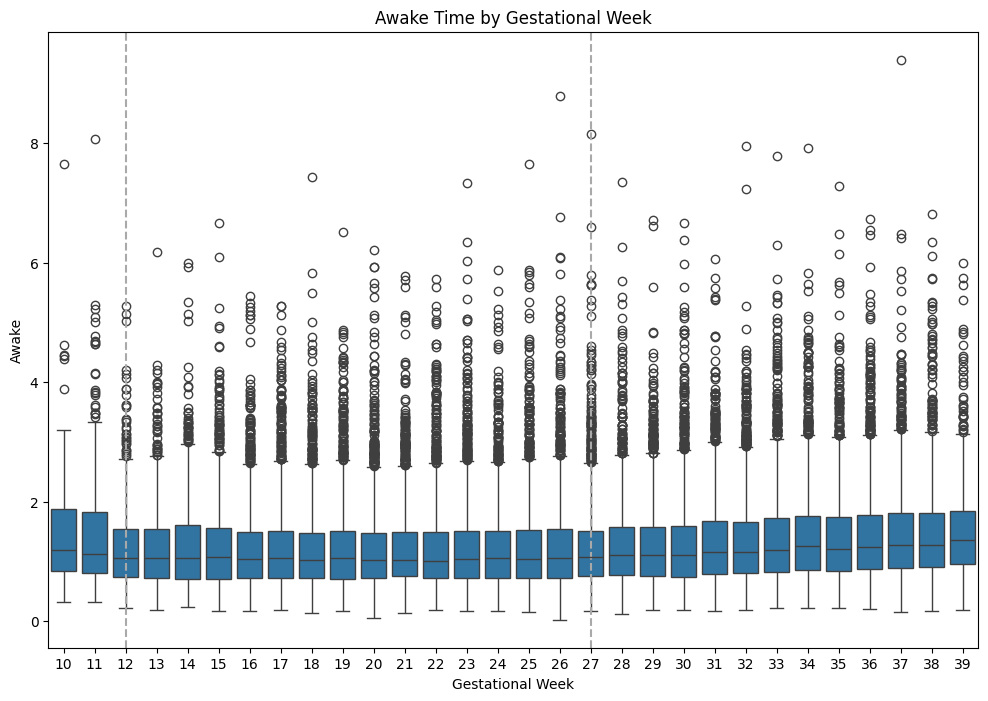

In [55]:

filtered_df = df_w_static[(df_w_static['Gestational_week'] >= 10) & (df_w_static['Gestational_week'] <= 39)]

filtered_df['Gestational_week'] = filtered_df['Gestational_week'].astype('int')

plt.figure(figsize=(12, 8))

sns.boxplot(x='Gestational_week', y='awake', data=filtered_df)

#sns.lineplot(x='Gestational_week', y='awake', data=filtered_df, 
#             marker='o', color='red', label='Aggregate')

#plt.xticks(ticks=range(10, 40), labels=range(10, 40))

# Add vertical lines at specific gestational weeks (based on the position in categorical x-axis)
plt.axvline(x=2, color='darkgray', linestyle='--')  # Gestational week 12
plt.axvline(x=17, color='darkgray', linestyle='--')  # Gestational week 27

# Add labels and title
plt.xlabel('Gestational Week')
plt.ylabel('Awake')
plt.title('Awake Time by Gestational Week')
#plt.legend()

# Show the plot
plt.show()


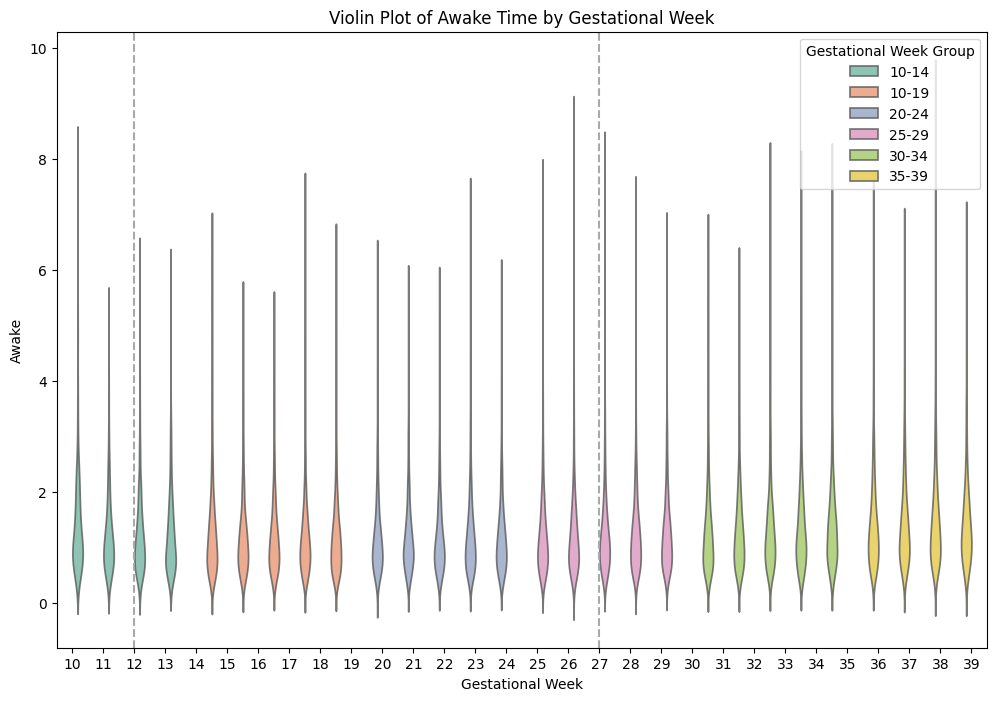

In [56]:
filtered_df = df_w_static[(df_w_static['Gestational_week'] >= 10) & (df_w_static['Gestational_week'] <= 39)]

# Convert Gestational_week to a categorical variable to ensure consistent x-axis behavior
filtered_df['Gestational_week'] = filtered_df['Gestational_week'].astype('int')

# Create a new column to group Gestational_week into 5 categories
bins = [10, 14, 19, 24, 29, 34, 39]  # Defining the ranges for each group
labels = ['10-14', '10-19', '20-24', '25-29', '30-34', '35-39']  # Labels for each group
filtered_df['Gestational_week_group'] = pd.cut(filtered_df['Gestational_week'].astype(int), bins=bins, labels=labels, right=True)

plt.figure(figsize=(12, 8))

# Create a violin plot with Gestational_week treated as categorical, colored by group
sns.violinplot(x='Gestational_week', y='awake', data=filtered_df, hue='Gestational_week_group',
               split=False, palette='Set2', inner=None, alpha=0.8,
               width=2, density_norm='width')


# Add vertical lines at specific gestational weeks
plt.axvline(x=2, color='darkgray', linestyle='--')  # Corresponds to Gestational week 12
plt.axvline(x=17, color='darkgray', linestyle='--')  # Corresponds to Gestational week 27

# Add labels and title
plt.xlabel('Gestational Week')
plt.ylabel('Awake')
plt.title('Violin Plot of Awake Time by Gestational Week')

# Remove legend if not needed, otherwise leave plt.legend()
plt.legend(title="Gestational Week Group")

# Show the plot
plt.show()


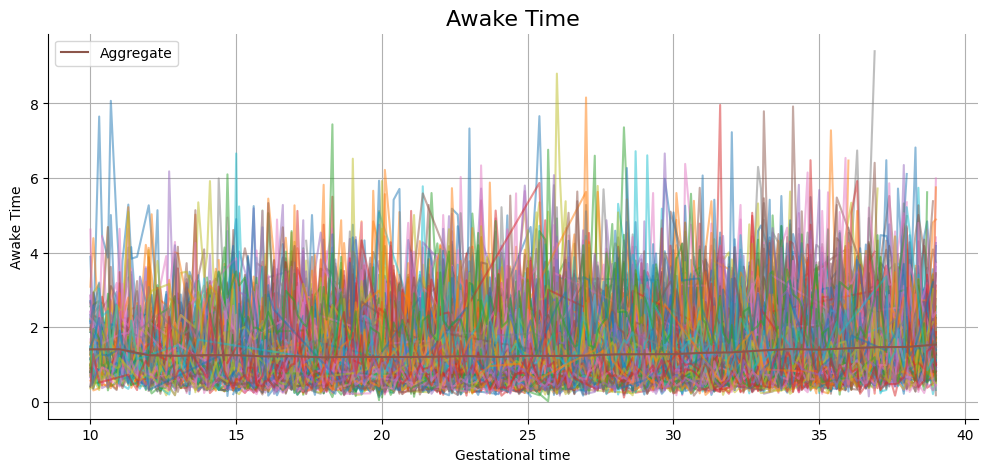

In [57]:
plt.figure(figsize=(12, 5))

# Plot all lines (spaghetti plot)
for ids in df_w_static.record_id.unique():
    subset = df_w_static.loc[df_w_static.record_id == ids]
    subset = subset.sort_values(by='time')
    plt.plot(subset['time'], subset['awake'], alpha=0.5)

# Plot the mean line
sns.lineplot(x='Gestational_week', y='awake', data=df_w_static, label='Aggregate')

# Labels and title
plt.title('Awake Time', fontsize=16)
plt.xlabel('Gestational time')
plt.ylabel('Awake Time')
plt.legend()

# Show the plot
plt.grid(True)
sns.despine()
plt.show()

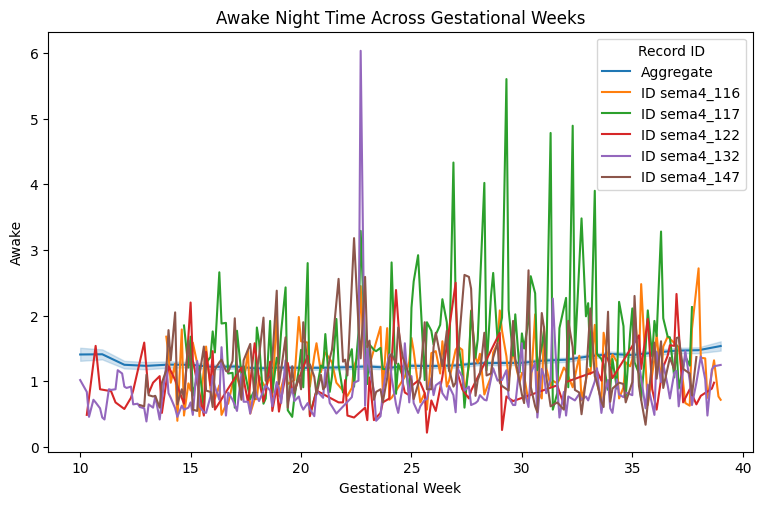

In [55]:
plt.figure(figsize=(20, 12))
plt.subplot(2, 2, 1)

# Main line plot using seaborn for the overall trends
sns.lineplot(x='Gestational_week', y='awake', data=df_w_static, label='Aggregate')

# Loop through each healthy ID and plot on the same subplot
for healthyid in super_healthy_id[5:10]:
    subset = df_w_static.loc[df_w_static.record_id == healthyid]
    subset = subset.sort_values(by='time')
    plt.plot(subset['time'], subset['awake'], label=f'ID {healthyid}')

plt.title('Awake Night Time Across Gestational Weeks')
plt.xlabel('Gestational Week')
plt.ylabel('Awake')
plt.legend(title='Record ID')  # Add legend with title
plt.show()

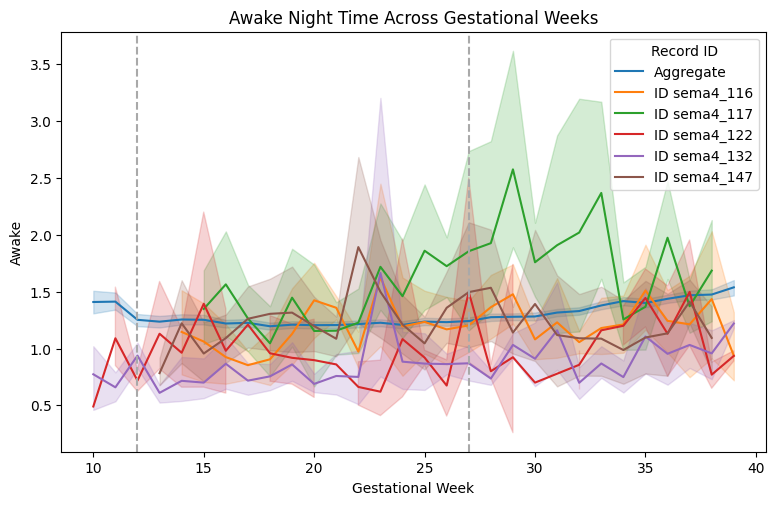

In [50]:
plt.figure(figsize=(20, 12))
plt.subplot(2, 2, 1)

# Main line plot using seaborn for the overall trends
sns.lineplot(x='Gestational_week', y='awake', data=df_w_static, label='Aggregate')

# Loop through each healthy ID and plot on the same subplot
for healthyid in super_healthy_id[5:10]:
    subset = df_w_static.loc[df_w_static.record_id == healthyid]
    subset = subset.sort_values(by='Gestational_week')
    sns.lineplot(x='Gestational_week', y='awake', data=subset, label=f'ID {healthyid}')

plt.axvline(x=12, color='darkgray', linestyle='--')
plt.axvline(x=27, color='darkgray', linestyle='--')
plt.title('Awake Night Time Across Gestational Weeks')
plt.xlabel('Gestational Week')
plt.ylabel('Awake')
plt.legend(title='Record ID')  # Add legend with title
plt.show()

Text(0, 0.5, 'Awake Night Time')

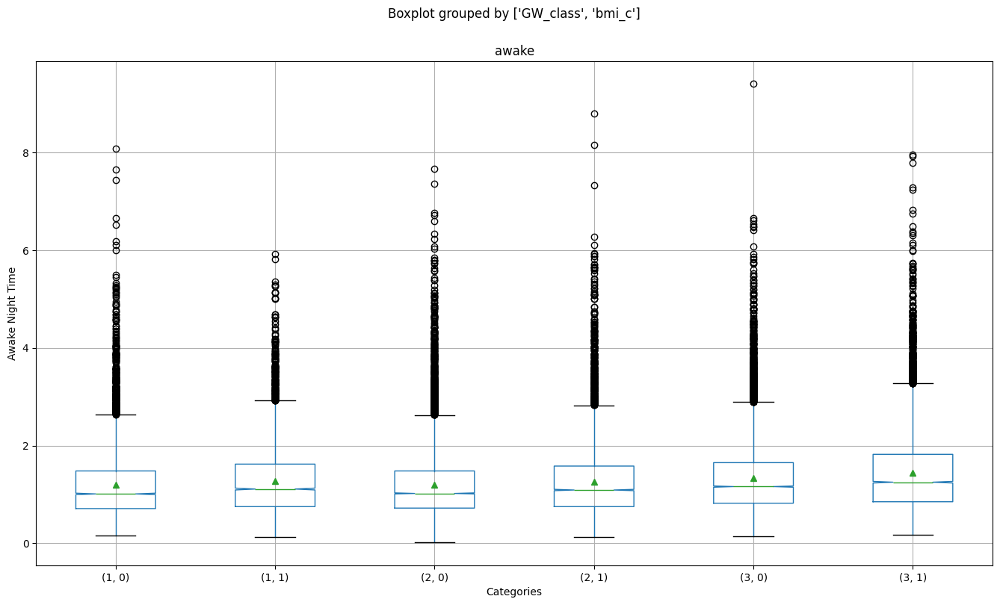

In [51]:
boxplot = df_w_static.boxplot(["awake"], by = ["GW_class","bmi_c"],
                     figsize = (16, 9),
                     showmeans = True,
                     notch = True)

boxplot.set_xlabel("Categories")
boxplot.set_ylabel("Awake Night Time")

#boxplot.figure.savefig("...\\boxplot.png")

In [50]:
summary_stats = df_w_static.loc[:,['awake','deep','rem','light','total','GW_class']].groupby('GW_class').agg(['mean', 'std'])

In [51]:
summary_stats

awake                deep                 rem            \
              mean       std      mean       std      mean       std   
GW_class                                                               
1         1.237377  0.749160  1.466557  0.688982  1.549069  0.669774   
2         1.230643  0.736476  1.400238  0.700686  1.659309  0.707013   
3         1.383434  0.809422  1.287649  0.696885  1.760754  0.741935   

             light               total            
              mean       std      mean       std  
GW_class                                          
1         4.605314  1.077156  7.620956  1.224018  
2         4.376442  1.042377  7.436026  1.217317  
3         4.139736  0.998521  7.188151  1.236913

In [55]:
results = {}
summaries = {}
sleep_stages = ['deep', 'rem', 'light', 'total','awake']
for sleep_stage in sleep_stages:
    model = smf.mixedlm(f"{sleep_stage} ~ GW_class", df_w_static, groups=df_w_static['map_id']) #Gestational_week
    mdf = model.fit()
    p_value = mdf.pvalues['GW_class']
    results[sleep_stage] = p_value
    summaries[sleep_stage] = mdf.summary()

for stage, summary in summaries.items():
    print(f"Results for {stage}:")
    print(summary.tables[1])
# Creating the output table
table1 = pd.DataFrame({
    'Sleep Stage': sleep_stages,
    'p-value': [results[stage] for stage in sleep_stages]
})

print(table1)

Results for deep:
            Coef. Std.Err.        z  P>|z|  [0.025  0.975]
Intercept   1.626    0.029   56.499  0.000   1.569   1.682
GW_class   -0.118    0.003  -44.770  0.000  -0.123  -0.113
Group Var   0.305    0.051                                
Results for rem:
           Coef. Std.Err.       z  P>|z| [0.025 0.975]
Intercept  1.425    0.027  53.724  0.000  1.373  1.477
GW_class   0.110    0.003  35.891  0.000  0.104  0.116
Group Var  0.252    0.037                             
Results for light:
            Coef. Std.Err.        z  P>|z|  [0.025  0.975]
Intercept   4.794    0.034  139.564  0.000   4.726   4.861
GW_class   -0.221    0.005  -44.215  0.000  -0.231  -0.211
Group Var   0.404    0.036                                
Results for total:
            Coef. Std.Err.        z  P>|z|  [0.025  0.975]
Intercept   7.844    0.036  216.227  0.000   7.773   7.915
GW_class   -0.229    0.006  -35.784  0.000  -0.241  -0.216
Group Var   0.425    0.030                                

In [56]:
# Formula for MMRM
# "outcome ~ time + covariate1 + covariate2" specifies the fixed effects
# "1|id" specifies a random intercept for each subject
formula = 'awake ~ time + bmi + age' #time*bmi, time*age
#formula = 'temperature_delta ~ GW_class'
# Fit the mixed model
model = smf.mixedlm(formula, df_w_static, groups=df_w_static['map_id'])
result = model.fit()

# Print the summary
print(result.summary())

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: awake      
No. Observations: 51343   Method:             REML       
No. Groups:       385     Scale:              0.4263     
Min. group size:  5       Log-Likelihood:     -51734.7153
Max. group size:  328     Converged:          Yes        
Mean group size:  133.4                                  
----------------------------------------------------------
            Coef.  Std.Err.    z     P>|z|  [0.025  0.975]
----------------------------------------------------------
Intercept   0.679     0.166   4.081  0.000   0.353   1.005
time        0.011     0.000  27.980  0.000   0.011   0.012
bmi         0.011     0.004   2.825  0.005   0.003   0.018
age         0.002     0.004   0.447  0.655  -0.006   0.009
Group Var   0.168     0.019                               



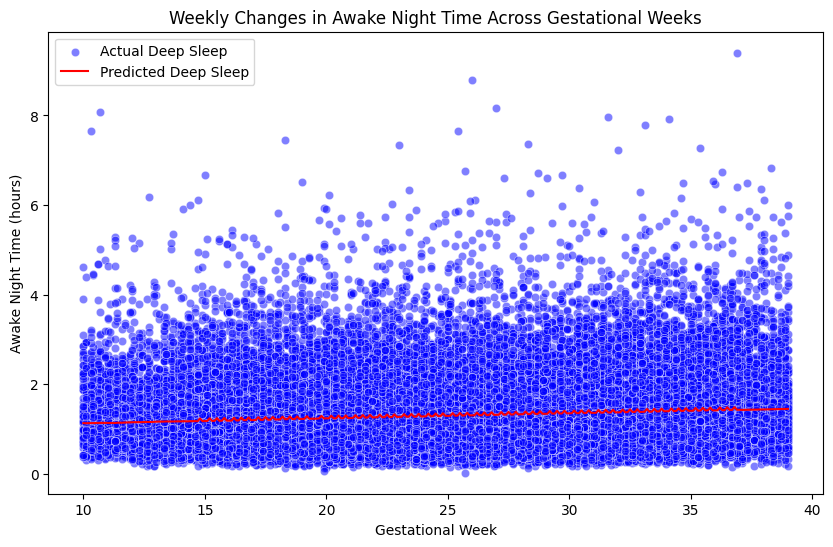

In [57]:
df_w_static['PredictedDeepSleep'] = result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='awake', data=df_w_static, color='blue', alpha=0.5, label='Actual Deep Sleep')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static, color='red', label='Predicted Deep Sleep', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Awake Night Time (hours)')
plt.title('Weekly Changes in Awake Night Time Across Gestational Weeks')
plt.legend()

plt.show()

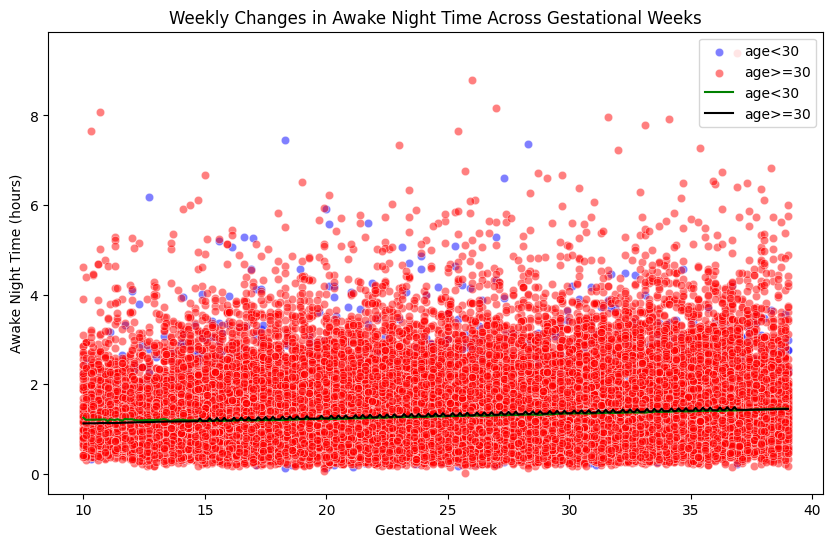

In [58]:
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)
df_w_static['PredictedDeepSleep'] = result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='awake', data=df_w_static[df_w_static.age_c==0], color='blue', alpha=0.5, label='age<30')
sns.scatterplot(x='time', y='awake', data=df_w_static[df_w_static.age_c==1], color='red', alpha=0.5, label='age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==0], color='green', label='age<30', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==1], color='black', label='age>=30', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Awake Night Time (hours)')
plt.title('Weekly Changes in Awake Night Time Across Gestational Weeks')
plt.legend()

plt.show()

In [59]:
df_grouped = df_w_static.loc[:,['record_id','map_id','time','GW_class','awake','age_c','bmi_c','n_prev_baby']].copy()
df_grouped['parity'] = 0
df_grouped.loc[df_grouped.n_prev_baby>0, 'parity'] = 1 
stat_id = df_grouped.groupby('record_id')[['map_id','age_c','bmi_c','parity']].first().reset_index()

time_range = np.sort(df_w_static.time.unique())
#time_range = np.arange(10.0, 39.1, 0.1)

time_df = pd.DataFrame(time_range, columns=['time'])
time_df['key'] = 0
record_df = pd.DataFrame(df_grouped['record_id'].unique(), columns=['record_id'])
record_df['key'] = 0

# Cartesian product of record_ids and time_range
full_df = pd.merge(record_df, time_df, on='key').drop(columns=['key'])
full_df['time'] = full_df['time'].round(1).astype(float)

# Merge this with original data
df_grouped = pd.merge(full_df, df_grouped, on=['record_id', 'time'], how='left')
c2=df_grouped.time.gt(19)&df_grouped.time.le(29)
c3=df_grouped.time.gt(29)&df_grouped.time.le(39)
df_grouped.loc[df_grouped.time.le(19),'GW_class'] = 1.0
df_grouped.loc[c2,'GW_class'] = 2.0
df_grouped.loc[c3,'GW_class'] = 3.0


In [60]:
part_df = df_grouped.groupby(['record_id','GW_class'])[['awake']].apply(lambda x: x.isna().sum()).reset_index()
part_df.rename(columns={'awake': 'participation'}, inplace=True)
part_df = pd.merge(part_df, stat_id, on=['record_id'], how='left')


In [61]:
part_df.head()

,record_id,GW_class,participation,map_id,age_c,bmi_c,parity
0,direct_10,1.0,25,0,1,0,1
1,direct_10,2.0,32,0,1,0,1
2,direct_10,3.0,25,0,1,0,1
3,direct_109,1.0,23,1,1,0,0
4,direct_109,2.0,50,1,1,0,0


In [62]:
# Perform t-test to compare participation based on parity
segment = 2.0
parity_participation = part_df[(part_df['parity'] == 1)&(part_df['GW_class'] == segment)]['participation']
no_parity_participation = part_df[(part_df['parity'] == 0)&(part_df['GW_class'] == segment)]['participation']

t_stat, p_value = ttest_ind(parity_participation, no_parity_participation)

print(f"T-test results: t_stat = {t_stat}, p_value = {p_value}")

T-test results: t_stat = -1.9428679114592313, p_value = 0.0527645890217107


In [63]:
t_stat, p_value = ttest_ind(parity_participation, no_parity_participation, equal_var=False) #Welch’s t-test

print(f"T-test results: t_stat = {t_stat}, p_value = {p_value}")

T-test results: t_stat = -2.1525059588866036, p_value = 0.032717868004672725


In [64]:
model_formula = 'awake ~ age + bmi + EED_g + n_prev_baby + GW_class:EED_g + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c'# + time:bmi'

mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

print(mixedlm_result.summary())

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: awake      
No. Observations: 51343   Method:             REML       
No. Groups:       385     Scale:              0.4278     
Min. group size:  5       Log-Likelihood:     -51834.2333
Max. group size:  328     Converged:          Yes        
Mean group size:  133.4                                  
---------------------------------------------------------
               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept       0.926    0.206  4.485 0.000  0.521  1.330
age            -0.002    0.004 -0.496 0.620 -0.010  0.006
bmi             0.011    0.005  1.989 0.047  0.000  0.021
EED_g           0.016    0.021  0.788 0.430 -0.024  0.057
n_prev_baby    -0.021    0.022 -0.939 0.348 -0.063  0.022
GW_class:EED_g -0.004    0.003 -1.179 0.239 -0.011  0.003
GW_class:bmi_c  0.043    0.008  5.721 0.000  0.028  0.058
bmi_c:age_c    -0.097   

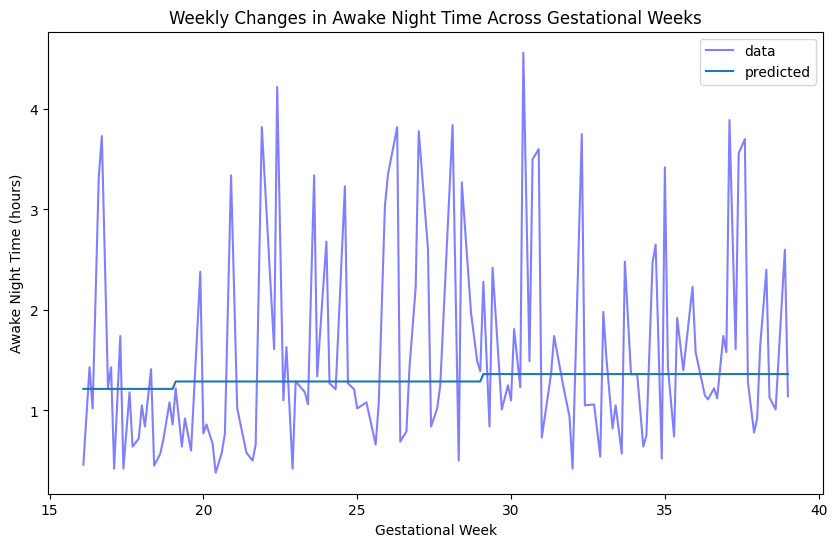

In [65]:
subset = df_w_static.loc[df_w_static.record_id==super_healthy_id[10]]
subset = subset.sort_values(by='time')
predict_res = mixedlm_result.predict(subset)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.lineplot(x='time', y='awake', data=subset, color='blue', alpha=0.5, label='data')

# Line plot of predicted deep sleep times
plt.plot(np.array(subset.time), predict_res, label='predicted')

plt.xlabel('Gestational Week')
plt.ylabel('Awake Night Time (hours)')
plt.title('Weekly Changes in Awake Night Time Across Gestational Weeks')
plt.legend()

plt.show()

### Different models inflection points 

In [67]:
from scipy.interpolate import UnivariateSpline
from ruptures import Pelt, Binseg
import ruptures as rpt
#from bayesian_changepoint_detection.bayesian_changepoint_detection import offline_changepoint_detection
from functools import partial
#import bayesian_changepoint_detection.offline_changepoint_detection as offline
from scipy.stats import gaussian_kde
from statsmodels.nonparametric.smoothers_lowess import lowess

In [68]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel, RBF
#https://scikit-learn.org/stable/auto_examples/gaussian_process/plot_gpr_prior_posterior.html#sphx-glr-auto-examples-gaussian-process-plot-gpr-prior-posterior-py

In [69]:
def plot_gpr_samples(gpr_model, n_samples, ax):
    """Plot samples drawn from the Gaussian process model.

    If the Gaussian process model is not trained then the drawn samples are
    drawn from the prior distribution. Otherwise, the samples are drawn from
    the posterior distribution. Be aware that a sample here corresponds to a
    function.

    Parameters
    ----------
    gpr_model : `GaussianProcessRegressor`
        A :class:`~sklearn.gaussian_process.GaussianProcessRegressor` model.
    n_samples : int
        The number of samples to draw from the Gaussian process distribution.
    ax : matplotlib axis
        The matplotlib axis where to plot the samples.
    """
    x = np.linspace(0, 5, 100)
    X = x.reshape(-1, 1)

    y_mean, y_std = gpr_model.predict(X, return_std=True)
    y_samples = gpr_model.sample_y(X, n_samples)
    y_pred, y_std = gpr.predict(X, return_std=True)

    for idx, single_prior in enumerate(y_samples.T):
        ax.plot(
            x,
            single_prior,
            linestyle="--",
            alpha=0.7,
            label=f"Sampled function #{idx + 1}",
        )
    ax.plot(x, y_mean, color="black", label="Mean")
    ax.fill_between(
        x,
        y_mean - y_std,
        y_mean + y_std,
        alpha=0.1,
        color="black",
        label=r"$\pm$ 1 std. dev.",
    )
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_ylim([-3, 3])

In [70]:
from scipy.ndimage import uniform_filter1d

def smooth_array_scipy(data, window_size=3):
    # Apply uniform filter
    return uniform_filter1d(data, size=window_size)

def smooth_array_convolution(data, window_size=3):
    # Create a moving average (box) filter
    kernel = np.ones(window_size) / window_size
    # Apply convolution using 'same' mode to keep the array the same length as the original
    smoothed_data = np.convolve(data, kernel, mode='same')
    return smoothed_data

def smooth_array_ema(data, alpha=0.2):
    # Initialize the smoothed data array
    smoothed_data = np.zeros_like(data)
    smoothed_data[0] = data[0]  # Start with the first element
    # Apply Exponential Moving Average on the rest
    for i in range(1, len(data)):
        smoothed_data[i] = alpha * data[i] + (1 - alpha) * smoothed_data[i-1]
    return smoothed_data

In [71]:
#help(bayesian_changepoint_detection)

In [72]:
df_w_static.time.min(), df_w_static.time.max()

(10.0, 39.0)

In [73]:
df_w_static.loc[:,['record_id', 'time', 'awake']].head()

,record_id,time,awake
0,direct_10,39.0,1.21
1,direct_10,38.7,2.05
2,direct_10,38.6,1.06
3,direct_10,38.4,0.94
4,direct_10,38.3,1.40


In [107]:
#u = df_w_static_inpoint.groupby(['record_id', 'time']).size()
#u[u>1]
#len(df_w_static_inpoint['record_id'].unique())

Shape of y_array: (385, 291)


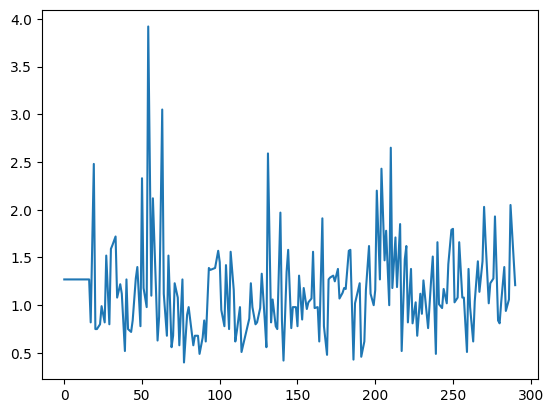

In [74]:
df_w_static_inpoint = df_w_static.loc[:,['record_id', 'time', 'awake']].copy()
df_w_static_inpoint = df_w_static_inpoint.groupby(['record_id', 'time']).agg({'awake': 'mean'}).reset_index()
df_w_static_inpoint['time'] = df_w_static_inpoint['time'].round(1).astype(float)

# Define the number of time points
time_range = np.arange(10.0, 39.1, 0.1)

"""
# Create a MultiIndex from every combination of record_id and time_range
multi_index = pd.MultiIndex.from_product([df_w_static_inpoint['record_id'].unique(), time_range], names=['record_id', 'time'])
# Reindex the original data to this full range grid
full_df = df_w_static_inpoint.set_index(['record_id', 'time']).reindex(multi_index)
# Reset the index to turn it back into columns
full_df.reset_index(inplace=True)
"""

time_df = pd.DataFrame(time_range, columns=['time'])
time_df['key'] = 0
record_df = pd.DataFrame(df_w_static_inpoint['record_id'].unique(), columns=['record_id'])
record_df['key'] = 0

# Cartesian product of record_ids and time_range
full_df = pd.merge(record_df, time_df, on='key').drop(columns=['key'])
full_df['time'] = full_df['time'].round(1).astype(float)

# Merge this with original data
full_df = pd.merge(full_df, df_w_static_inpoint, on=['record_id', 'time'], how='left')
full_df['awake'].interpolate(inplace=True)
full_df.ffill(inplace=True)
full_df.bfill(inplace=True)

pivot_df = full_df.pivot(index='record_id', columns='time', values='awake')
y_array = pivot_df.to_numpy()

print("Shape of y_array:", y_array.shape)
#print(y_array)
plt.plot(y_array[0])

In [75]:
sum(sum(np.isnan(y_array))), 385*291, len(df_w_static), 385*291-sum(sum(np.isnan(y_array)))

(0, 112035, 51343, 112035)

In [76]:
x = time_range; y = y_array[0]

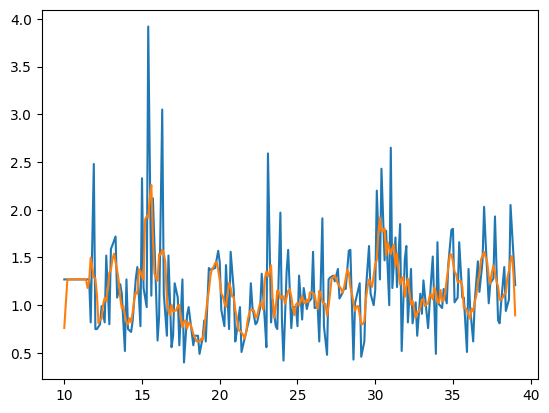

In [77]:
plt.figure()
plt.plot(x, y)
plt.plot(x, smooth_array_convolution(y, 5))
plt.show()

In [79]:
"""
smoothed_y = smooth_array_convolution(y, 5)
kernel = 1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0))
gpr = GaussianProcessRegressor(kernel=kernel,
        random_state=0).fit(x, smoothed_y.reshape(1, -1))
gpr.score(x, y)
#"""

'\nsmoothed_y = smooth_array_convolution(y, 5)\nkernel = 1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0))\ngpr = GaussianProcessRegressor(kernel=kernel,\n        random_state=0).fit(x, smoothed_y.reshape(1, -1))\ngpr.score(x, y)\n#'

In [81]:
"""
fig, axs = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(10, 8))

# plot prior
plot_gpr_samples(gpr, n_samples=n_samples, ax=axs[0])
axs[0].set_title("Samples from prior distribution")

# plot posterior
gpr.fit(X_train, y_train)
plot_gpr_samples(gpr, n_samples=n_samples, ax=axs[1])
axs[1].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Observations")
axs[1].legend(bbox_to_anchor=(1.05, 1.5), loc="upper left")
axs[1].set_title("Samples from posterior distribution")

fig.suptitle("Radial Basis Function kernel", fontsize=18)
plt.tight_layout()
#"""

'\nfig, axs = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(10, 8))\n\n# plot prior\nplot_gpr_samples(gpr, n_samples=n_samples, ax=axs[0])\naxs[0].set_title("Samples from prior distribution")\n\n# plot posterior\ngpr.fit(X_train, y_train)\nplot_gpr_samples(gpr, n_samples=n_samples, ax=axs[1])\naxs[1].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Observations")\naxs[1].legend(bbox_to_anchor=(1.05, 1.5), loc="upper left")\naxs[1].set_title("Samples from posterior distribution")\n\nfig.suptitle("Radial Basis Function kernel", fontsize=18)\nplt.tight_layout()\n#'

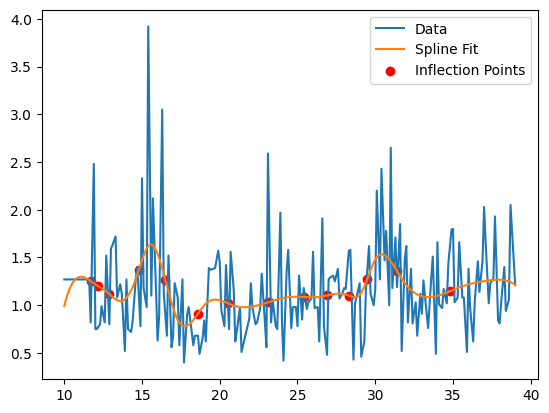

In [82]:
#Spline Regression
smoothed_y = smooth_array_convolution(y, 5)
#spline = UnivariateSpline(x, smoothed_y, s=0)
spline = UnivariateSpline(x, smoothed_y, s=10)

# Calculate the second derivatives
second_derivative = spline.derivative(n=2)

# Find the inflection points (where second derivative changes sign)
inflection_points = x[np.where(np.diff(np.sign(second_derivative(x))))[0]]
# Plotting
plt.plot(x, y, label='Data')
plt.plot(x, spline(x), label='Spline Fit')
plt.scatter(inflection_points, spline(inflection_points), color='red', label='Inflection Points')
plt.legend()
plt.show()

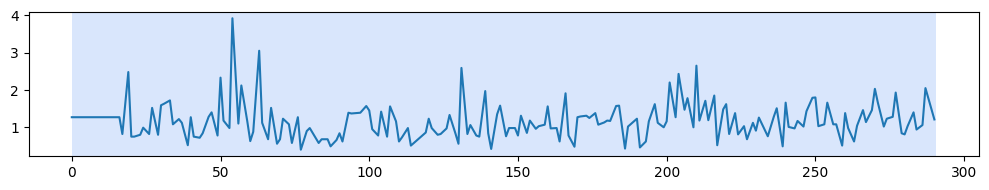

Change points: [291]


In [83]:
#Change Point Detection Algorithms
model = "l2"
algo = rpt.Pelt(model=model).fit(y)
result = algo.predict(pen=10)

# Plotting
rpt.display(y, result)
plt.show()

print("Change points:", result)

In [84]:
#Bayesian Change Point Detection
Q, P, Pcp = offline_changepoint_detection(y, partial(offline.const_prior, l=(len(y) + 1)), 
                                          offline.gaussian_obs_log_likelihood, truncate=-40)

# Plotting
plt.plot(np.exp(Pcp).sum(0))

NameError: name 'offline_changepoint_detection' is not defined

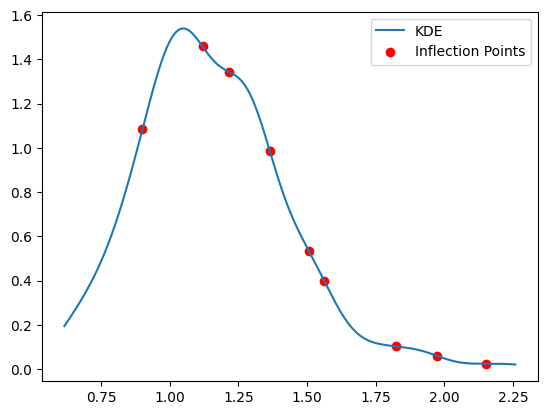

Inflection points: [0.90117718 1.11964865 1.21492192 1.3644024  1.50731231 1.56316216
 1.82434234 1.97218018 2.15287087]


In [85]:
# Kernel Density Estimation
kde = gaussian_kde(smoothed_y)
x_grid = np.linspace(min(smoothed_y), max(smoothed_y), 1000)
kde_values = kde(x_grid)

# Find inflection points
second_derivative = np.gradient(np.gradient(kde_values))
inflection_points = x_grid[np.where(np.diff(np.sign(second_derivative)))[0]]

# Plotting
plt.plot(x_grid, kde_values, label='KDE')
plt.scatter(inflection_points, kde(inflection_points), color='red', label='Inflection Points')
plt.legend()
plt.show()

print("Inflection points:", inflection_points)

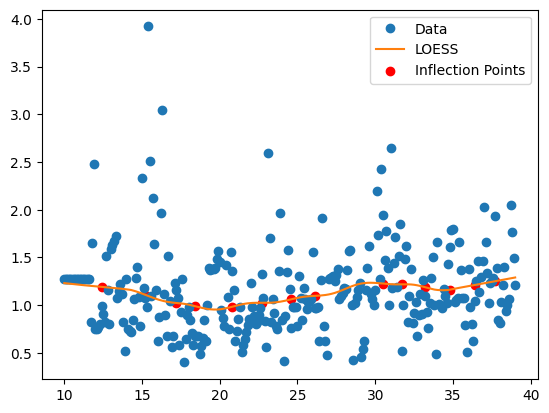

Inflection points: [12.4 15.2 17.2 18.4 20.8 22.7 24.6 26.1 28.  30.5 31.7 33.2 34.8 36.4
 37.7]


In [86]:
# Local Polynomial Regression (LOESS)
loess_result = lowess(smoothed_y, x, frac=0.3)

# Calculate second derivative
second_derivative = np.gradient(np.gradient(loess_result[:, 1]))

# Find inflection points
inflection_points = loess_result[np.where(np.diff(np.sign(second_derivative)))[0], 0]

# Plotting
plt.plot(x, y, 'o', label='Data')
plt.plot(loess_result[:, 0], loess_result[:, 1], '-', label='LOESS')
plt.scatter(inflection_points, loess_result[np.where(np.diff(np.sign(second_derivative)))[0], 1], color='red', label='Inflection Points')
plt.legend()
plt.show()

print("Inflection points:", inflection_points)

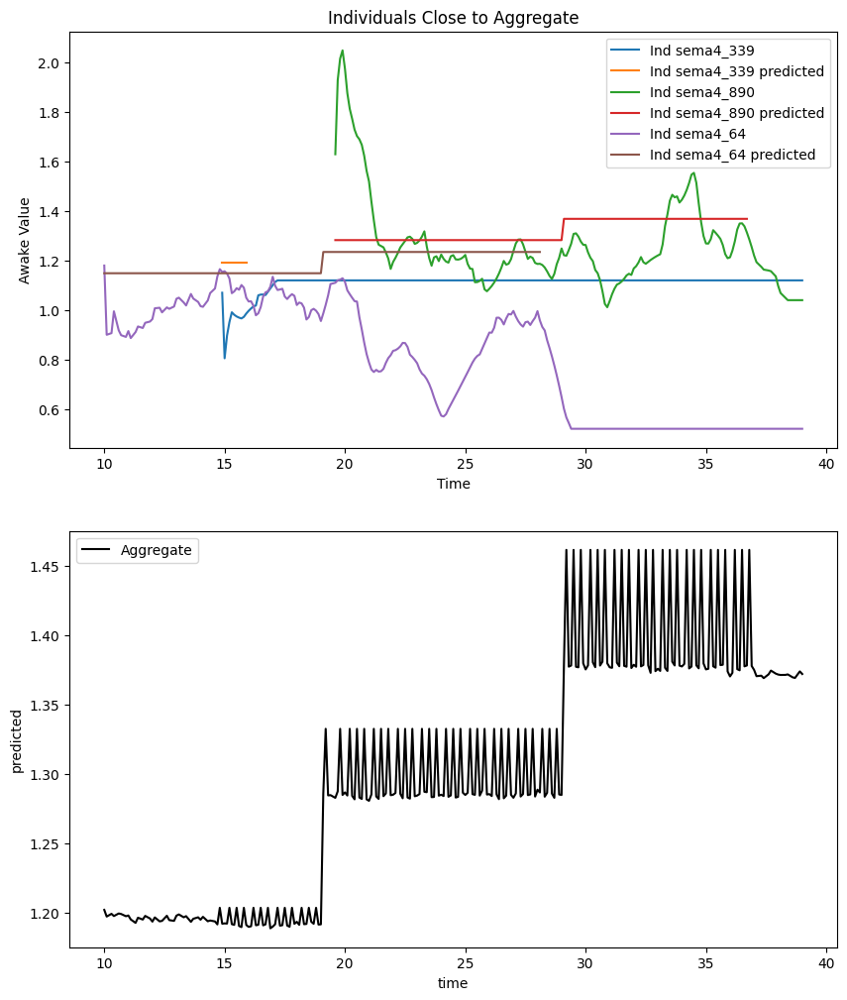

In [102]:
data = df_w_static.loc[:,['time','map_id','awake','record_id']].copy()
fixed_effects = mixedlm_result.fittedvalues
#data['predicted'] = fixed_effects + mixedlm_result.random_effects[data['map_id']].values
data['predicted'] = mixedlm_result.predict(df_w_static)
data['residuals'] = data['awake'] - data['predicted']
rmse = data.groupby('record_id')['residuals'].apply(lambda x: np.sqrt(np.mean(x**2)))
# Select individuals with the lowest and highest RMSE
low_rmse_individuals = rmse.nsmallest(3).index
high_rmse_individuals = rmse.nlargest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['awake'].interpolate(inplace=True)
    smoothed_values = ind_data['awake'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['awake'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['awake'], linestyle='-', label=f'Ind {xind}')
    axs[0].plot(part_pre['time'], part_pre['predicted'], linestyle='-', label=f'Ind {xind} predicted')
#axs[0].plot(data['time'], fixed_effects, color='black', label='Aggregate')
sns.lineplot(x='time', y='predicted', data=data, color='black', label='Aggregate', errorbar=None)
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Awake Value')
axs[0].legend()

In [94]:
df_w_static['smoothed_awake'] = df_w_static.groupby('record_id')['awake'].rolling(window=14, min_periods=1).mean().reset_index(drop=True)

In [95]:
model_formula = 'smoothed_awake ~ age + bmi + time + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c'# + time:bmi'

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

# Print the results
print(mixedlm_result.summary())
#"""
var_components = mixedlm_result.cov_re.iloc[0, 0]  # Random effects variance (tau^2)
residual_variance = mixedlm_result.scale            # Residual variance (sigma^2)

# Calculate ICC
icc = var_components / (var_components + residual_variance)

print(f"Interclass Correlation Coefficient (ICC): {icc:.3f}")

# Interpretation
if icc < 0.1:
    print("Little, if any, group variability.")
elif icc < 0.5:
    print("Moderate group variability.")
else:
    print("Substantial group variability.")

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: smoothed_awake
No. Observations: 51343   Method:             REML          
No. Groups:       385     Scale:              0.0698        
Min. group size:  5       Log-Likelihood:     -5644.8563    
Max. group size:  328     Converged:          Yes           
Mean group size:  133.4                                     
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          0.667    0.203  3.289 0.001  0.270  1.065
age                0.004    0.004  0.896 0.370 -0.004  0.011
bmi                0.007    0.005  1.352 0.176 -0.003  0.018
time               0.013    0.000 36.934 0.000  0.013  0.014
GW_class:bmi_c     0.030    0.003  9.712 0.000  0.024  0.037
bmi_c:age_c       -0.023    0.063 -0.360 0.719 -0.146  0.101
GW_class:age_c    -0.011    0.004 -3

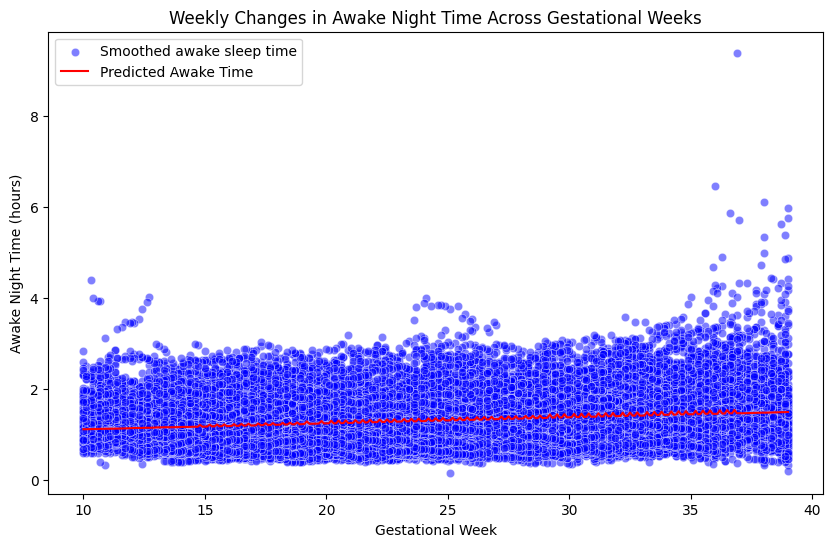

In [96]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='smoothed_awake', data=df_w_static, color='blue', alpha=0.5, label='Smoothed awake sleep time')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static, color='red', label='Predicted Awake Time', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Awake Night Time (hours)')
plt.title('Weekly Changes in Awake Night Time Across Gestational Weeks')
plt.legend()

plt.show()

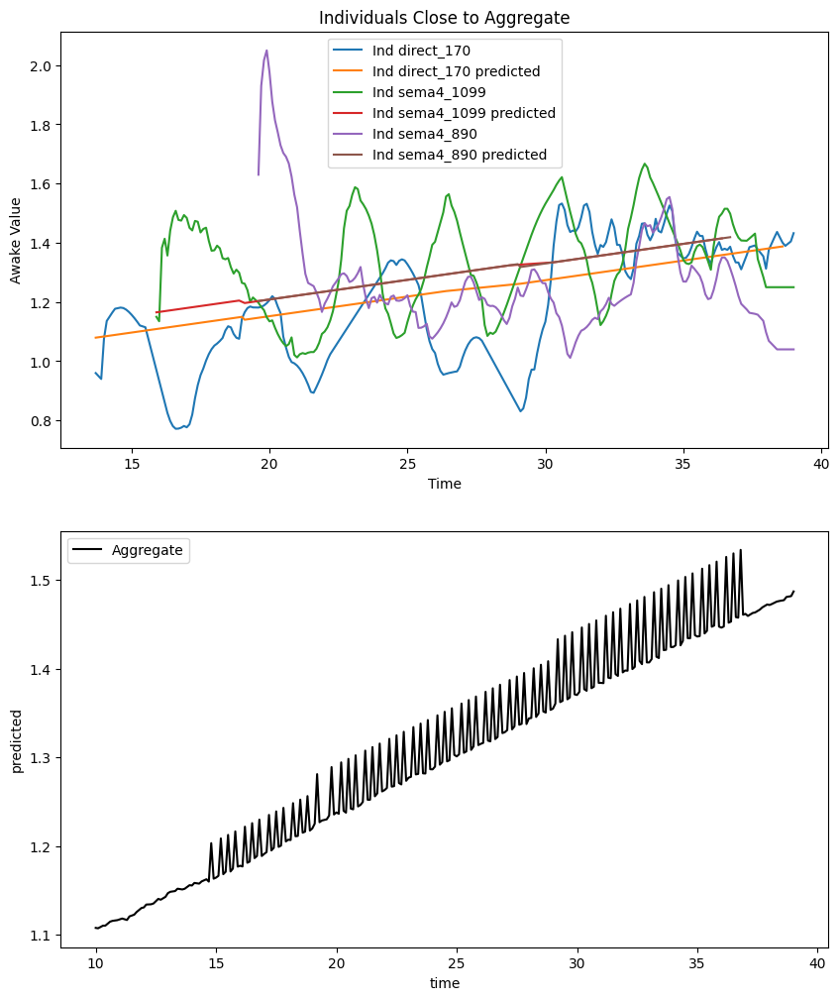

In [108]:
data = df_w_static.loc[:,['time','map_id','smoothed_awake','record_id']].copy()
fixed_effects = mixedlm_result.fittedvalues
#data['predicted'] = fixed_effects + mixedlm_result.random_effects[data['map_id']].values
data['predicted'] = mixedlm_result.predict(df_w_static)
data['residuals'] = data['smoothed_awake'] - data['predicted']
rmse = data.groupby('record_id')['residuals'].apply(lambda x: np.sqrt(np.mean(x**2)))
# Select individuals with the lowest and highest RMSE
low_rmse_individuals = rmse.nsmallest(3).index
high_rmse_individuals = rmse.nlargest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['awake'].interpolate(inplace=True)
    smoothed_values = ind_data['awake'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['awake'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['awake'], linestyle='-', label=f'Ind {xind}')
    axs[0].plot(part_pre['time'], part_pre['predicted'], linestyle='-', label=f'Ind {xind} predicted')
#axs[0].plot(data['time'], fixed_effects, color='black', label='Aggregate')
sns.lineplot(x='time', y='predicted', data=data, color='black', label='Aggregate', errorbar=None)
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Awake Value')
axs[0].legend()

In [58]:
from scipy.stats import linregress
def calculate_slope(group):
    if len(group) < 2:
        return np.nan
    x = np.arange(len(group))
    slope, _, _, _, _ = linregress(x, group)
    return slope

In [59]:
df_w_static = df_w_static.sort_values(by=['record_id', 'time']).reset_index(drop=True)
slopes = df_w_static.groupby('record_id')['smoothed_deep'].apply(calculate_slope) #smoothed_deep, deep
slopes_2nd = df_w_static.groupby('record_id')['PredictedDeepSleep'].apply(calculate_slope)

In [60]:
# Identify record_id with the most negative slopes (indicating decreasing 'deep' values)
record_id_most_decreasing = slopes.idxmin()

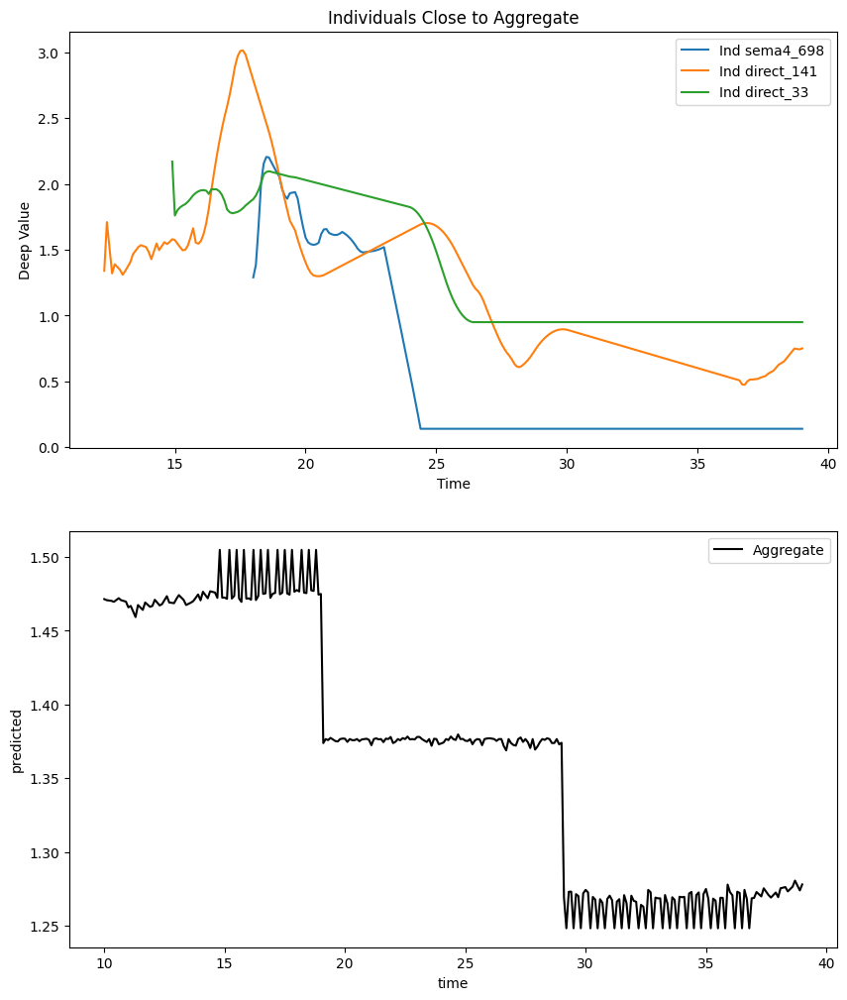

In [61]:
deducted_slopes =  slopes - slopes_2nd

low_rmse_individuals = deducted_slopes.nsmallest(3).index
high_rmse_individuals = deducted_slopes.nlargest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
    #axs[0].plot(part_pre['time'], part_pre['predicted'], linestyle='-', label=f'Ind {xind} predicted')
#axs[0].plot(data['time'], fixed_effects, color='black', label='Aggregate')
sns.lineplot(x='time', y='predicted', data=data, color='black', label='Aggregate', errorbar=None)
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Deep Value')
axs[0].legend()

In [70]:
deducted_slopes_super_healthy = deducted_slopes[deducted_slopes.index.isin(super_healthy_id)]
deducted_slopes_others = deducted_slopes[~deducted_slopes.index.isin(super_healthy_id)]
comparison = {
    'Super Healthy': deducted_slopes_super_healthy.mean()/np.abs(slopes_2nd.mean()),
    'Others': deducted_slopes_others.mean()/np.abs(slopes_2nd.mean())
}
print(comparison)

{'Super Healthy': -1.0498483575338435, 'Others': -0.24349010213503094}


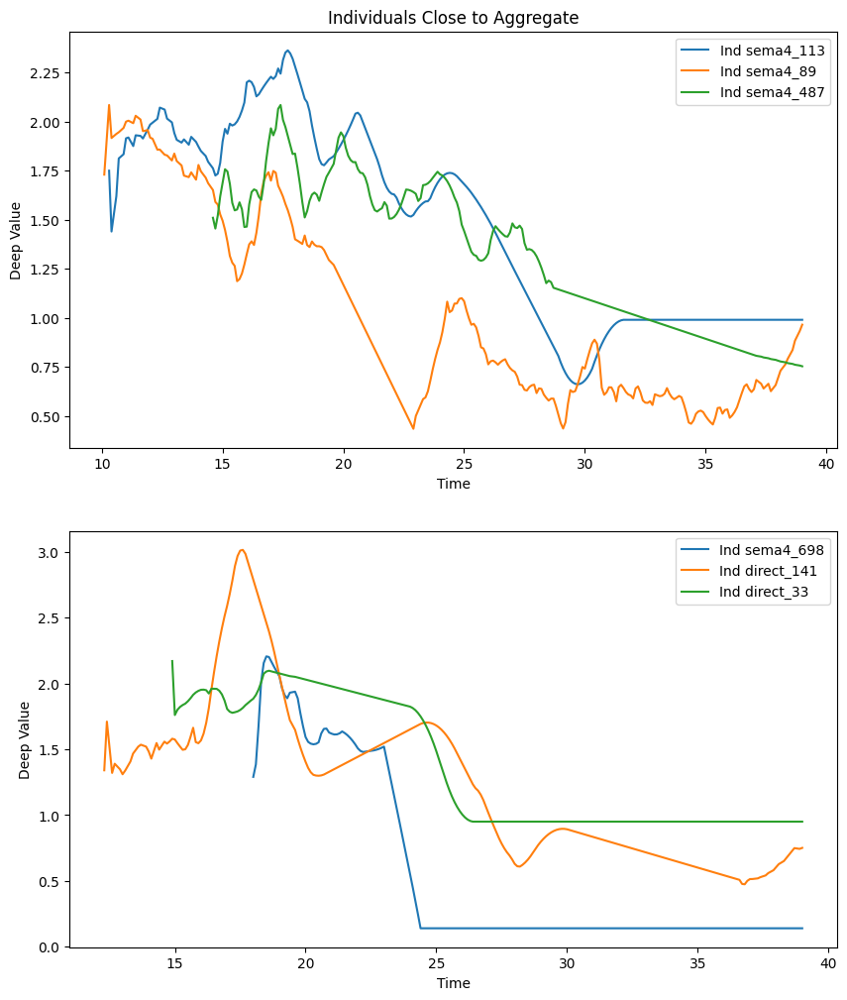

In [101]:
low_rmse_individuals = deducted_slopes_super_healthy.nsmallest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
    
low_rmse_individuals = deducted_slopes_others.nsmallest(3).index

for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[1].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Deep Value')
axs[0].legend()
axs[1].set_title('Individuals Close to Aggregate')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Deep Value')
axs[1].legend()

In [83]:
df_slopes = pd.DataFrame({
    'record_id': deducted_slopes.index,
    'deducted_slope': deducted_slopes.values
}).set_index('record_id')

#part_df = part_df.join(df_slopes, on='record_id')
part_df = pd.merge(part_df, static_feat2, on=['record_id'], how='left')

In [95]:
part_df.columns

Index(['record_id', 'GW_class', 'participation', 'map_id', 'age_c', 'bmi_c',
       'parity', 'deducted_slope', 'gestage_week', 'age', 'weight_pre', 'bmi',
       'n_prev_baby', 'birth_mode', 'induction_yn', 'EED_b1', 'EED_b2',
       'EED_a1', 'EED_a2', 'EED_g'],
      dtype='object')

In [117]:
aggregate_slope = deducted_slopes.mean()

# Function to find subgroups with slopes close to aggregate slope
def find_closest_subgroups(df, feature, aggregate_slope, n_closest=5):
    print(df.groupby(feature)['deducted_slope'].count())
    subgroups = df.groupby(feature)['deducted_slope'].mean()
    closest_subgroups = (subgroups - aggregate_slope).abs().nsmallest(n_closest)
    values = closest_subgroups.values / aggregate_slope
    closest_subgroups = closest_subgroups.index
    return closest_subgroups, values.round(3)

# Example: Find subgroups for each static feature
#features = ['age', 'weight_pre', 'bmi', 'n_prev_baby']
#features = ['participation', 'age_c', 'bmi_c', 'parity']
features = ['birth_mode', 'induction_yn', 'EED_b1', 'EED_b2','EED_a1', 'EED_a2', 'EED_g']
closest_subgroups = {}
closest_subgroups_val = {}

for feature in features:
    closest_subgroups[feature], closest_subgroups_val[feature] = find_closest_subgroups(part_df, feature, aggregate_slope)

print("Subgroups with slopes closest to aggregate slope:")
for feature, subgroups in closest_subgroups.items():
    print(f"{feature}: {subgroups.tolist()}")
    print(f"{feature}: {closest_subgroups_val[feature].tolist()}")
    

birth_mode
1.0    369
2.0    807
Name: deducted_slope, dtype: int64
induction_yn
0.0    792
1.0    384
Name: deducted_slope, dtype: int64
EED_b1
False    690
True     486
Name: deducted_slope, dtype: int64
EED_b2
False    825
True     351
Name: deducted_slope, dtype: int64
EED_a1
False    1044
True      132
Name: deducted_slope, dtype: int64
EED_a2
False    969
True     207
Name: deducted_slope, dtype: int64
EED_g
0    486
1    351
2    132
3    207
Name: deducted_slope, dtype: int64
Subgroups with slopes closest to aggregate slope:
birth_mode: [2.0, 1.0]
birth_mode: [-0.673, -1.44]
induction_yn: [0.0, 1.0]
induction_yn: [-0.113, -0.203]
EED_b1: [False, True]
EED_b1: [-0.442, -0.651]
EED_b2: [False, True]
EED_b2: [-0.153, -0.392]
EED_a1: [False, True]
EED_a1: [-0.413, -3.181]
EED_a2: [False, True]
EED_a2: [-0.035, -0.11]
EED_g: [3, 1, 0, 2]
EED_g: [-0.11, -0.392, -0.651, -3.181]


In [116]:
1056/3

352.0

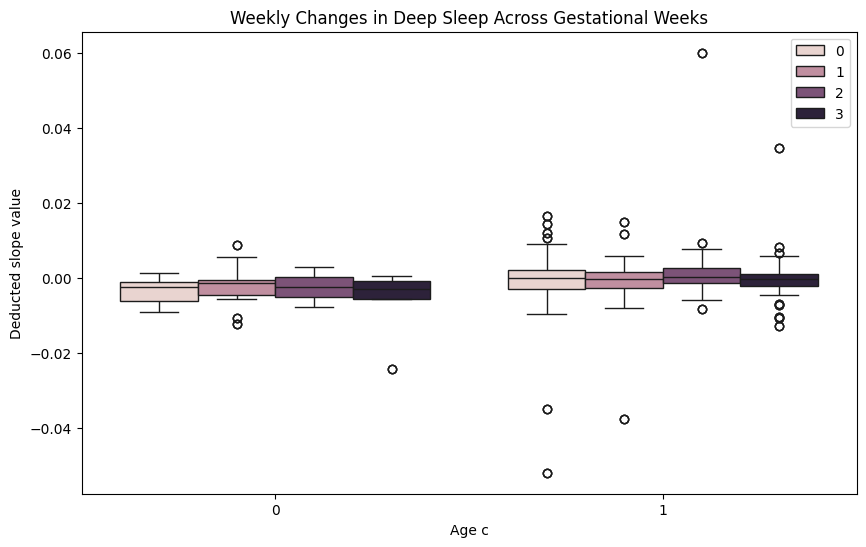

In [120]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='age_c', y='deducted_slope', hue='EED_g', data=part_df)
#plt.scatter(part_df['record_id'].iloc[500], aggregate_slope, color='black', s=100, label='Aggregate Slope')

plt.xlabel('Age c')
plt.ylabel('Deducted slope value')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [121]:
from scipy.stats import f_oneway #ANOVA test

group_0 = part_df[part_df['EED_g'] == 0]['deducted_slope']
group_1 = part_df[part_df['EED_g'] == 1]['deducted_slope']
group_2 = part_df[part_df['EED_g'] == 2]['deducted_slope']
group_3 = part_df[part_df['EED_g'] == 3]['deducted_slope']

f_stat, p_value = f_oneway(group_0, group_1, group_2, group_3)

print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value}")

F-statistic: 4.7421375987772585
P-value: 0.002712010424477862


In [111]:
part_df.columns

Index(['record_id', 'GW_class', 'participation', 'map_id', 'age_c', 'bmi_c',
       'parity', 'deducted_slope', 'gestage_week', 'age', 'weight_pre', 'bmi',
       'n_prev_baby', 'birth_mode', 'induction_yn', 'EED_b1', 'EED_b2',
       'EED_a1', 'EED_a2', 'EED_g'],
      dtype='object')

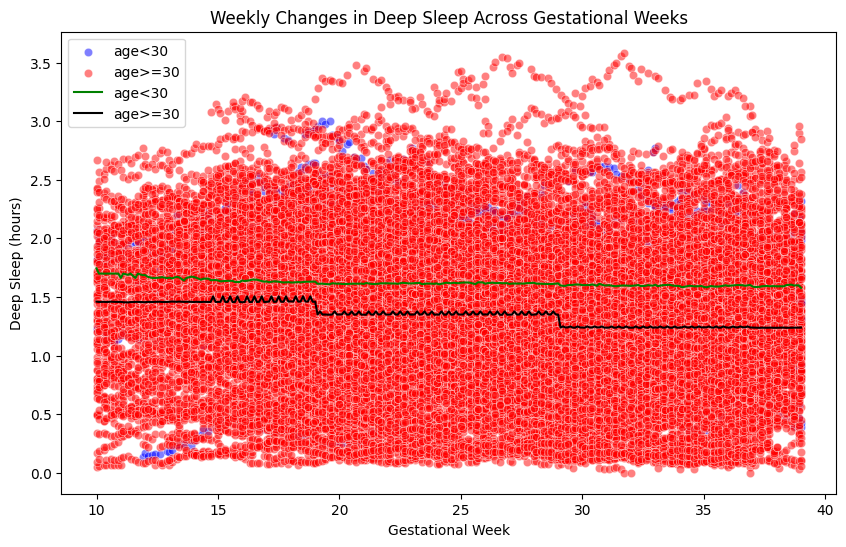

In [101]:
# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='smoothed_deep', data=df_w_static[df_w_static.age_c==0], color='blue', alpha=0.5, label='age<30')
sns.scatterplot(x='time', y='smoothed_deep', data=df_w_static[df_w_static.age_c==1], color='red', alpha=0.5, label='age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==0], color='green', label='age<30', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==1], color='black', label='age>=30', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [63]:
df_birth.columns

Index(['user_id', 'record_id', 'redcap_event_name', 'date', 'birth_number',
       'birth_date', 'birth_scheduled', 'birth_scheduled_unsure',
       'birth_gestage', 'birth_mode', 'induction_yn', 'induction_reason',
       'vacuumforceps', 'vaginalaftercesarean', 'birth_c_type',
       'birth_incision', 'birth_indication', 'birth_apgar1', 'birth_apgar2',
       'birth_abnormal1', 'birth_describe1', 'conditionsknown',
       'birth_abnormal2', 'birth_describe2', 'conditionsknown_2',
       'birth_maternal___1', 'birth_maternal___2', 'birth_maternal___4',
       'hypertension', 'hellpsyndrome', 'birth_urine', 'postparhem',
       'hem_meds', 'birth_matmorbid', 'birth_describe', 'birth_stay',
       'birth_stay_baby', 'birth_stay_baby_yes', 'birth_feeding',
       'birth_matleave', 'birth_mat_leave_length',
       'birthing_data_cohort_2_only_complete'],
      dtype='object')

In [97]:
deducted_slopes

record_id
direct_10     0.000624
direct_109   -0.003440
direct_113   -0.000687
direct_116   -0.000999
direct_118   -0.000701
                ...   
sema4_984    -0.000737
sema4_989    -0.003250
sema4_990     0.001420
sema4_991    -0.001356
sema4_992    -0.001565
Length: 385, dtype: float64

In [95]:
part_df

,record_id,GW_class,participation,map_id,age_c,bmi_c,parity
0,direct_10,1.0,25,0,1,0,1
1,direct_10,2.0,32,0,1,0,1
2,direct_10,3.0,25,0,1,0,1
3,direct_109,1.0,23,1,1,0,0
4,direct_109,2.0,50,1,1,0,0
...,...,...,...,...,...,...,...
1150,sema4_991,2.0,35,383,1,0,0
1151,sema4_991,3.0,25,383,1,0,0
1152,sema4_992,1.0,64,384,0,1,0
1153,sema4_992,2.0,30,384,0,1,0


In [ ]:
super_healthy_id

In [94]:
rmse = data.groupby('map_id')['residuals'].apply(lambda x: np.sqrt(np.mean(x**2)))

In [97]:
rmse.nsmallest(3).index

Index([319, 235, 176], dtype='int64', name='map_id')

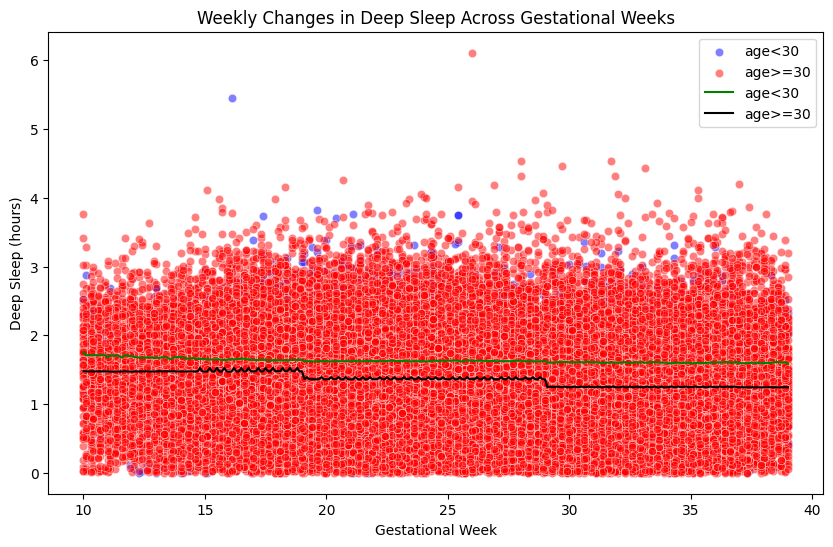

In [107]:
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.age_c==0], color='blue', alpha=0.5, label='age<30')
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.age_c==1], color='red', alpha=0.5, label='age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==0], color='green', label='age<30', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==1], color='black', label='age>=30', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [131]:
formula = 'rem ~ time + bmi + age' #time*bmi, time*age
model_rem = smf.mixedlm(formula, df_w_static, groups=df_w_static['map_id'])
result_rem = model_rem.fit()
print(result_rem.summary())

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: rem        
No. Observations: 51343   Method:             REML       
No. Groups:       385     Scale:              0.2519     
Min. group size:  5       Log-Likelihood:     -38401.3543
Max. group size:  328     Converged:          Yes        
Mean group size:  133.4                                  
----------------------------------------------------------
           Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
----------------------------------------------------------
Intercept   1.267     0.202   6.260  0.000   0.871   1.664
time        0.011     0.000  36.320  0.000   0.011   0.012
bmi        -0.000     0.005  -0.059  0.953  -0.009   0.009
age         0.003     0.004   0.678  0.498  -0.006   0.012
Group Var   0.253     0.037                               



In [66]:
model_formula = 'rem ~ age + bmi + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c'# + time:bmi'

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

# Print the results
print(mixedlm_result.summary())
var_components = mixedlm_result.cov_re.iloc[0, 0]  # Random effects variance (tau^2)
residual_variance = mixedlm_result.scale            # Residual variance (sigma^2)

# Calculate ICC
icc = var_components / (var_components + residual_variance)

print(f"Interclass Correlation Coefficient (ICC): {icc:.3f}")

# Interpretation
if icc < 0.1:
    print("Little, if any, group variability.")
elif icc < 0.5:
    print("Moderate group variability.")
else:
    print("Substantial group variability.")

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: rem        
No. Observations: 51343   Method:             REML       
No. Groups:       385     Scale:              0.2526     
Min. group size:  5       Log-Likelihood:     -38480.1137
Max. group size:  328     Converged:          Yes        
Mean group size:  133.4                                  
---------------------------------------------------------
               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept       1.876    0.243  7.707 0.000  1.399  2.353
age            -0.008    0.005 -1.693 0.091 -0.017  0.001
bmi            -0.008    0.006 -1.267 0.205 -0.021  0.004
GW_class:bmi_c -0.008    0.006 -1.326 0.185 -0.019  0.004
bmi_c:age_c     0.154    0.076  2.025 0.043  0.005  0.302
GW_class:age_c  0.112    0.004 27.672 0.000  0.104  0.120
Group Var       0.253    0.037                           

Interclass Correlation 

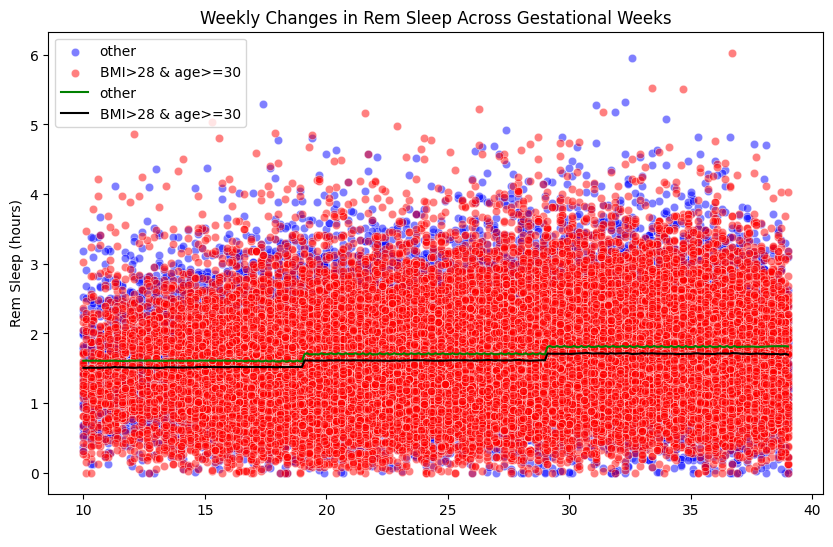

In [67]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)


# Plotting
indices = (df_w_static.bmi_c==1)&(df_w_static.age_c==1)

plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='rem', data=df_w_static[indices], color='blue', alpha=0.5, label='other')
sns.scatterplot(x='time', y='rem', data=df_w_static[~indices], color='red', alpha=0.5, label='BMI>28 & age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[indices], color='green', label='other', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[~indices], color='black', label='BMI>28 & age>=30', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Rem Sleep (hours)')
plt.title('Weekly Changes in Rem Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [68]:
model_formula = 'total ~ age + bmi + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c' #light

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

# Print the results
print(mixedlm_result.summary())

          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: total      
No. Observations:  51343   Method:             REML       
No. Groups:        385     Scale:              1.0976     
Min. group size:   5       Log-Likelihood:     -76011.0178
Max. group size:   328     Converged:          Yes        
Mean group size:   133.4                                  
----------------------------------------------------------
               Coef.  Std.Err.    z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept       8.298    0.321  25.837 0.000  7.669  8.928
age            -0.003    0.006  -0.539 0.590 -0.016  0.009
bmi            -0.020    0.009  -2.386 0.017 -0.037 -0.004
GW_class:bmi_c -0.066    0.012  -5.448 0.000 -0.089 -0.042
bmi_c:age_c     0.340    0.101   3.369 0.001  0.142  0.538
GW_class:age_c -0.198    0.008 -23.581 0.000 -0.214 -0.181
Group Var       0.433    0.031                            



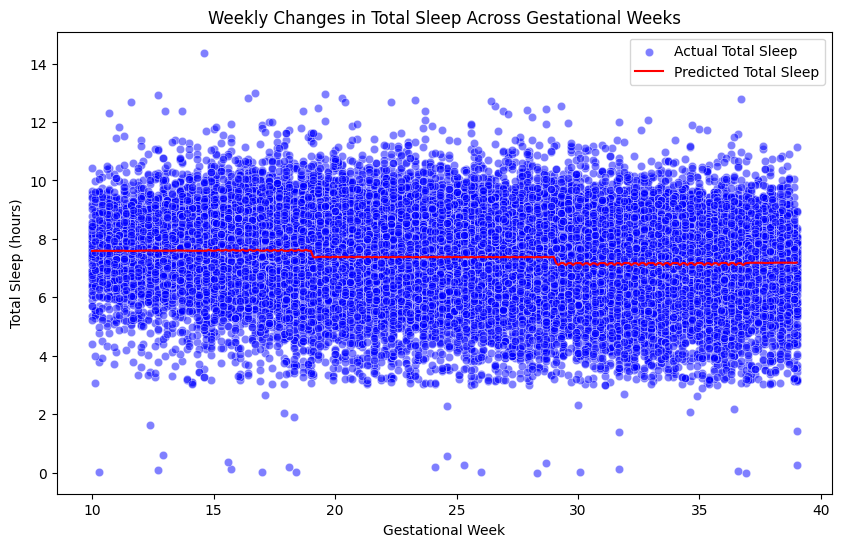

In [69]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='total', data=df_w_static, color='blue', alpha=0.5, label='Actual Total Sleep')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static, color='red', label='Predicted Total Sleep', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Total Sleep (hours)')
plt.title('Weekly Changes in Total Sleep Across Gestational Weeks')
plt.legend()

plt.show()

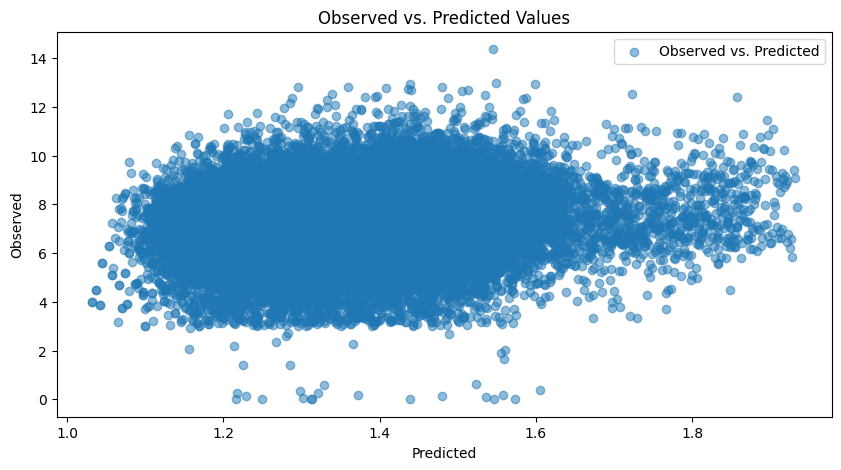

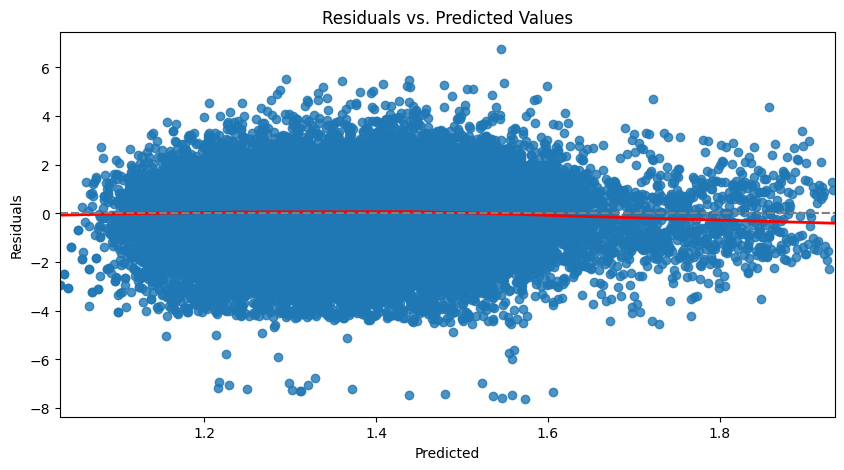

In [110]:
predictions = result.predict(df_w_static[['time', 'bmi', 'age']])

# Calculate residuals
residuals = df_w_static['total'] - predictions

# Plot observed vs. predicted values
plt.figure(figsize=(10, 5))
plt.scatter(predictions, df_w_static['total'], alpha=0.5, label='Observed vs. Predicted')
#plt.plot([df_w_static['total'].min(), df_w_static['total'].max()], [df_w_static['total'].min(), df_w_static['total'].max()], 'k--', lw=2, label='Perfect Fit')
plt.xlabel('Predicted')
plt.ylabel('Observed')
plt.title('Observed vs. Predicted Values')
plt.legend()
plt.show()

# Plot residuals
plt.figure(figsize=(10, 5))
sns.residplot(x=predictions, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 2})
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Values')
plt.axhline(y=0, color='grey', linestyle='--')
plt.show()

In [ ]:
## Regression model
#results = smf.ols('deep ~ time + np.log(rmssd)', data=data).fit()

Text(0.5, 1.0, 'Q-Q Plot')

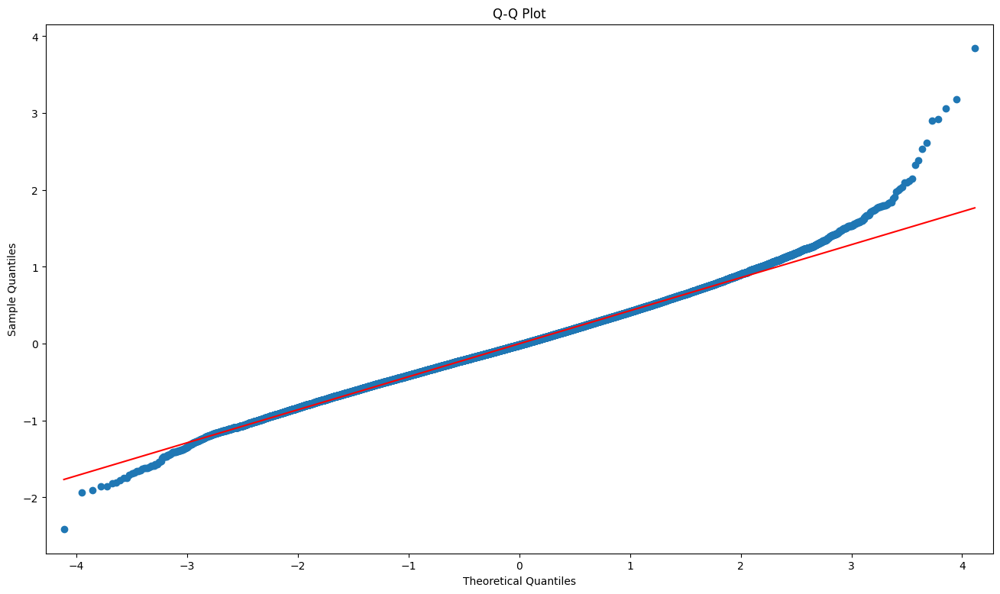

In [111]:
## Q-Q PLot

fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111)

sm.qqplot(result.resid, dist = stats.norm, line = 's', ax = ax)

ax.set_title("Q-Q Plot")

In [112]:
labels = ["Statistic", "p-value"]

norm_res = stats.shapiro(result.resid)

for key, val in dict(zip(labels, norm_res)).items():
    print(key, val)

Statistic 0.9950032234191895
p-value 8.997687665308198e-37


/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


## Robin

In [19]:
import plotly.graph_objects as go
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
from scipy.stats import ks_2samp


In [58]:
def duration(input_str, date_variable):
    # Remove any non-numeric characters from the input string
    if pd.isna(input_str):
        # print('Invalid input format')
        return ''

    input_str = ''.join(filter(str.isdigit, input_str))

    # Convert the input string to integers
    try:
        weeks = 0
        days = 0
        if len(input_str) > 3:
            # print('Invalid input format')
            return ''
        if len(input_str) == 3:
            weeks = int(input_str[:-1])
            days = int(input_str[-1:])
        if len(input_str) == 2:
            weeks = int(input_str)
            days = 0
    except ValueError:
        raise ValueError("Invalid input format")
    # Calculate the total number of days in the duration
    total_days = (weeks * 7) + days
    
    # Create a timedelta object for the duration
    duration = timedelta(days=total_days)

    return duration


df_birth['duration'] = df_birth.apply(lambda x: duration(x['birth_gestage'], x['date']), axis=1)
df_birth['duration'] = pd.to_timedelta(df_birth['duration'])
df_birth['conception'] = df_birth.apply(lambda row: pd.to_datetime(row['birth_date']) - row['duration'], axis=1)

def calculate_gestational_age(df, df_birth):
    conception_dates = df_birth.set_index('record_id')['conception'].to_dict()
    
    def gestational_age(row):
        conception_date = conception_dates.get(row['record_id'])
        if pd.isnull(conception_date):
            return None
        return (row['date'] - conception_date).days

    df['gestationalAge'] = df.apply(gestational_age, axis=1)
    
    return df

conceptionSleep = df_sleep.copy()
record_id_to_conception_date = dict(zip(df_birth.record_id, df_birth.conception))

conceptionSleep['date'] = pd.to_datetime(conceptionSleep['date'])

conceptionSleep = conceptionSleep[conceptionSleep.apply(lambda x: x.date >= record_id_to_conception_date.get(x.record_id, pd.to_datetime('1970-01-01')), axis=1)]

sleepTest = calculate_gestational_age(conceptionSleep, df_birth)

df_temp = sleepTest[['awake', 'record_id', 'gestationalAge']]
df_temp['gestationalWeek'] = np.floor(df_temp['gestationalAge'] / 7)
df_temp['gestationalWeek'] = df_temp['gestationalWeek'].astype('Int64')

mask = df_temp.groupby(['record_id', 'gestationalWeek']).filter(lambda x: len(x) >= 2)
weekly_avg_df = mask.groupby(['record_id', 'gestationalWeek']).agg({'awake': 'mean'}).reset_index()

# Rank ordering of participants

# Generate a reference U-shape curve (mean across all individuals)
def generate_reference_curve(data):
    ref_curve = data.groupby('gestationalWeek')['awake'].mean()
    return ref_curve

def quadratic(x, a, b, c):
    y = a*x**2 + b*x + c
    return y

r2 = []

# Count rejected participants:
lengthR = 0
vertexR = 0

for user in weekly_avg_df.record_id.unique():
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')
    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]




    if len(dfUser) < 15:
        lengthR += 1
        continue
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)

    y_values_raw = np.array(dfUser.awake.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]

    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        if (vertex_x < 10 or vertex_x > 40):
            vertexR += 1
            continue

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)

        r2.append([r2_value, user])
    else:
        lengthR += 1

print('Rejected Length - ' + str(lengthR))
print('Rejected Vertex - ' + str(vertexR))
print('Total Participants - ' + str(len(r2)))

sorted_r2 = sorted(r2, key=lambda x: x[0], reverse=True)
sorted_r2_df = pd.DataFrame(sorted_r2, columns=['r2_value', 'record_id'])

# For Graphing Individual Curves 

# Generate a reference U-shape curve (mean across all individuals)
def generate_reference_curve(data):
    ref_curve = data.groupby('gestationalWeek')['awake'].mean()
    return ref_curve

def quadratic(x, a, b, c):
    y = a*x**2 + b*x + c
    return y

/tmp/ipykernel_2959/4242515454.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['gestationalWeek'] = np.floor(df_temp['gestationalAge'] / 7)
/tmp/ipykernel_2959/4242515454.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['gestationalWeek'] = df_temp['gestationalWeek'].astype('Int64')


Rejected Length - 38
Rejected Vertex - 56
Total Participants - 306


In [59]:
vertexs = []
record_ids = ['sema4_779', 'sema4_512', 'sema4_339' , 'direct_281', 'sema4_831']
record_ids = weekly_avg_df.record_id.unique()

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.awake.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]

    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)
        if ((r2_value>=0.8)):# or (r2_value<0.1)):
            vertexs.append(vertex_x)
            # Graph the data along with the vertex
            fig = go.Figure()
            fig.add_trace(go.Scatter(x=x_values, y=y_values_raw, mode='markers', name='Raw Data'))
            fig.add_trace(go.Scatter(x=x_values, y=y_fitted, mode='lines', name='Quadratic Fit'))
            fig.add_trace(go.Scatter(x=[vertex_x], y=[vertex_y], mode='markers', marker=dict(color='red', size=10), name='Vertex'))

            # fig.update_xaxes(range=[-150, 0])
            fig.update_xaxes(range=[10, 40])
            fig.update_layout(title='Quadratic fit with Vertex on Weekly Data - ' + f'{user}, R2 Score={r2_value:.2f}', xaxis_title='Gestational Week', yaxis_title='AWAKE', legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
            #plt.show(fig)
            fig.show()
print(np.mean(vertexs))

21.464501806174123


In [60]:
data = []
record_ids = weekly_avg_df.record_id.unique()
vertexs = []
feat_name = 'awake'

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser[feat_name].values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]
    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)
        
        data.append({
            'record_id': user,
            'vertex': vertex_x,
            'r2_value': r2_value
        })

# Save the dataframe to a CSV file
df = pd.DataFrame(data)
df.to_csv(f'r2_{feat_name}.csv', index=False)

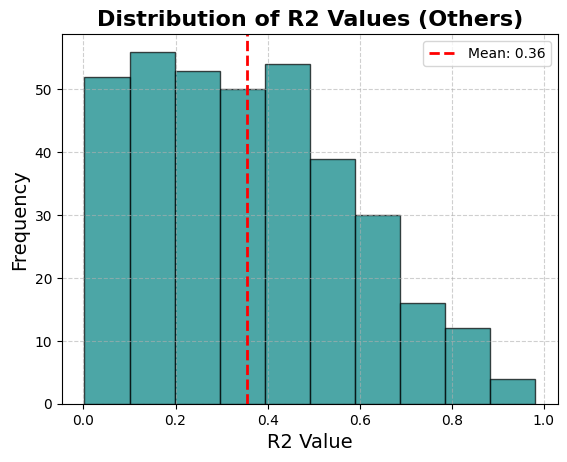

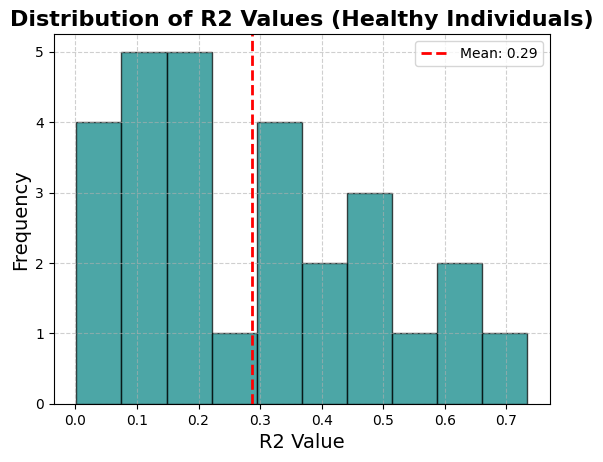

KS Statistic: 0.18052302888368463
P-value: 0.3220710623326204
No significant difference between the distributions (p >= 0.05).


In [96]:
record_ids = weekly_avg_df.record_id.unique()
vertexs = []
r2_list_other = []
r2_list_healthy = []

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.awake.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]

    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)

        vertexs.append(vertex_x)
        if user in super_healthy_id:
            r2_list_healthy.append(r2_value)
        else:
            r2_list_other.append(r2_value)
            
fig, ax = plt.subplots()

ax.hist(r2_list_other, bins=10, color='teal', edgecolor='black', alpha=0.7)
mean_value = np.mean(r2_list_other)
ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
ax.set_title('Distribution of R2 Values (Others)', fontsize=16, fontweight='bold')
ax.set_xlabel('R2 Value', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()
plt.show()

fig, ax = plt.subplots()

ax.hist(r2_list_healthy, bins=10, color='teal', edgecolor='black', alpha=0.7)
mean_value = np.mean(r2_list_healthy)
ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
ax.set_title('Distribution of R2 Values (Healthy Individuals)', fontsize=16, fontweight='bold')
ax.set_xlabel('R2 Value', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()
plt.show()

from scipy.stats import ks_2samp

# Perform the Kolmogorov-Smirnov test
ks_statistic, p_value = ks_2samp(r2_list_other, r2_list_healthy)

print(f"KS Statistic: {ks_statistic}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("The distributions are statistically different (p < 0.05).")
else:
    print("No significant difference between the distributions (p >= 0.05).")

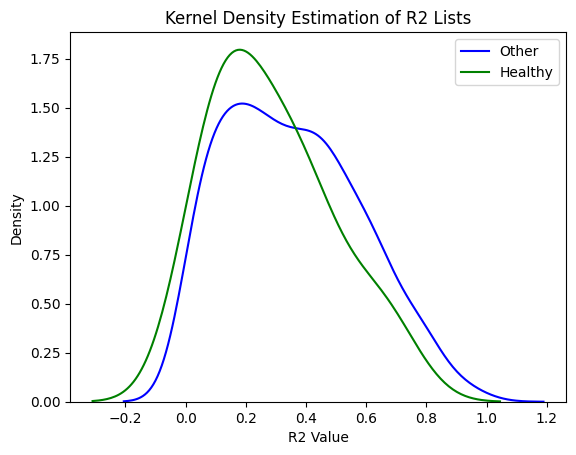

In [95]:
sns.kdeplot(r2_list_other, label='Other', color='blue')
sns.kdeplot(r2_list_healthy, label='Healthy', color='green')
plt.title('Kernel Density Estimation of R2 Lists')
plt.xlabel('R2 Value')
plt.ylabel('Density')

# Show legend
plt.legend()

# Show the plot
plt.show()

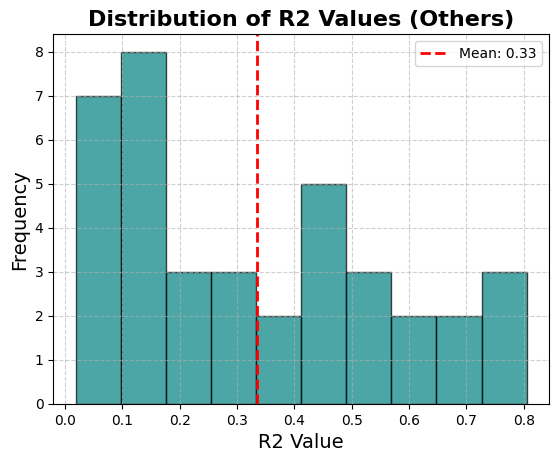

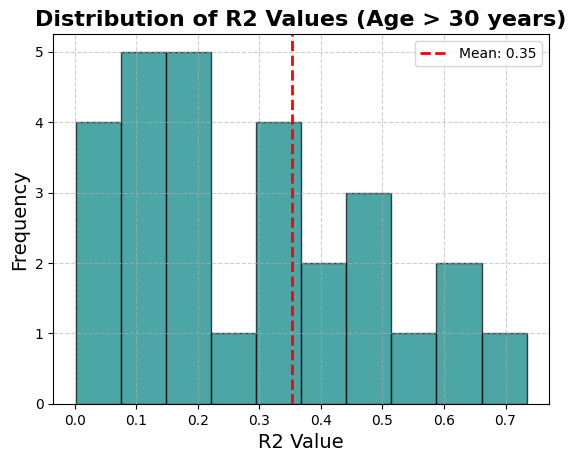

KS Statistic: 0.17089963280293757
P-value: 0.23915885303958603
No significant difference between the distributions (p >= 0.05).


In [99]:
h_age_id = df_w_static.loc[df_w_static.age_c==1].record_id.unique() #30 years
l_age_id = df_w_static.loc[df_w_static.age_c==0].record_id.unique()
record_ids = weekly_avg_df.record_id.unique()
vertexs = []
r2_list_other = []
r2_list_h = []

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.awake.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]

    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)

        vertexs.append(vertex_x)
        if user in h_age_id:
            r2_list_h.append(r2_value)
        elif user in l_age_id:
            r2_list_other.append(r2_value)
            
fig, ax = plt.subplots()

ax.hist(r2_list_other, bins=10, color='teal', edgecolor='black', alpha=0.7)
mean_value = np.mean(r2_list_other)
ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
ax.set_title('Distribution of R2 Values (Others)', fontsize=16, fontweight='bold')
ax.set_xlabel('R2 Value', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()
plt.show()

fig, ax = plt.subplots()

ax.hist(r2_list_healthy, bins=10, color='teal', edgecolor='black', alpha=0.7)
mean_value = np.mean(r2_list_h)
ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
ax.set_title('Distribution of R2 Values (Age > 30 years)', fontsize=16, fontweight='bold')
ax.set_xlabel('R2 Value', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()
plt.show()

from scipy.stats import ks_2samp

# Perform the Kolmogorov-Smirnov test
ks_statistic, p_value = ks_2samp(r2_list_other, r2_list_h)

print(f"KS Statistic: {ks_statistic}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("The distributions are statistically different (p < 0.05).")
else:
    print("No significant difference between the distributions (p >= 0.05).")

super healthy length: 28


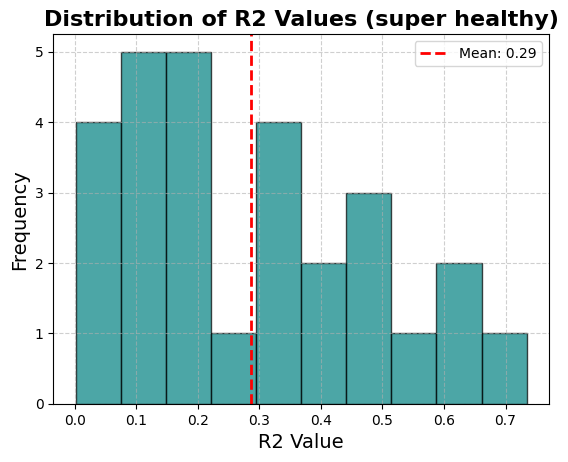

KS Statistic: 0.13179271708683474
P-value: 0.7209202328885743
No significant difference between the distributions (p >= 0.05).
Very Preterm length: 4


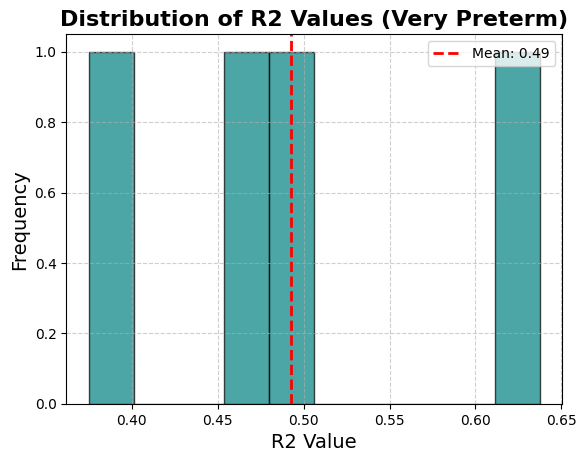

KS Statistic: 0.6039215686274509
P-value: 0.0688033918906691
No significant difference between the distributions (p >= 0.05).
Late Preterm length: 76


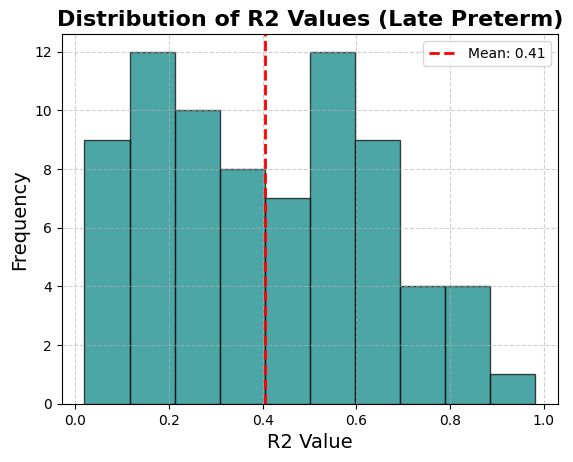

KS Statistic: 0.2025799793601651
P-value: 0.013688781085270347
The distributions are statistically different (p < 0.05).
Preeclampsia length: 43


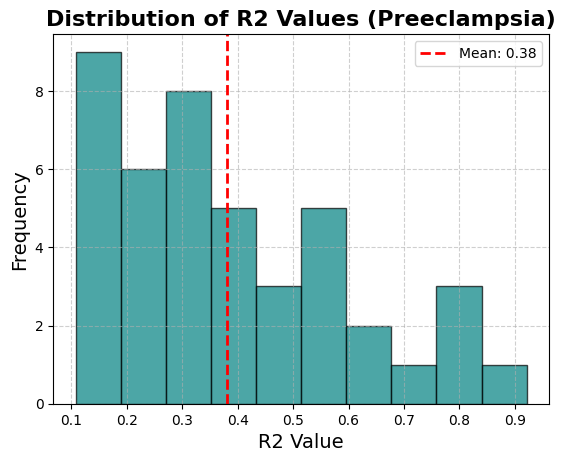

KS Statistic: 0.1843137254901961
P-value: 0.14225949628794465
No significant difference between the distributions (p >= 0.05).
Postpartum Hemorrhage (PPH) length: 37


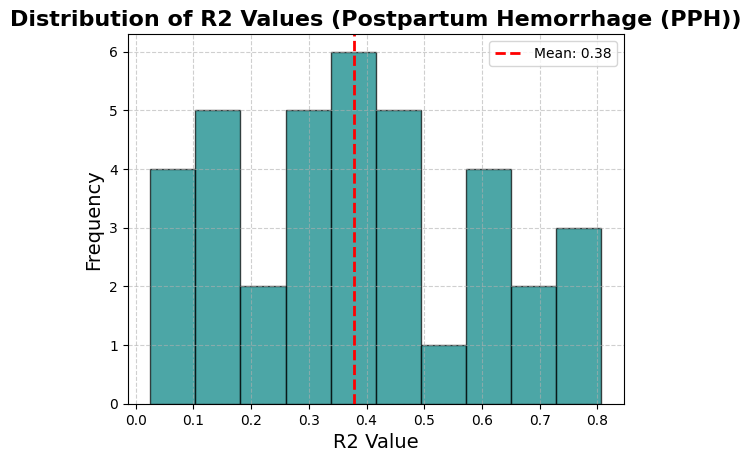

KS Statistic: 0.16894541600423954
P-value: 0.27887479675630855
No significant difference between the distributions (p >= 0.05).
others length: 255


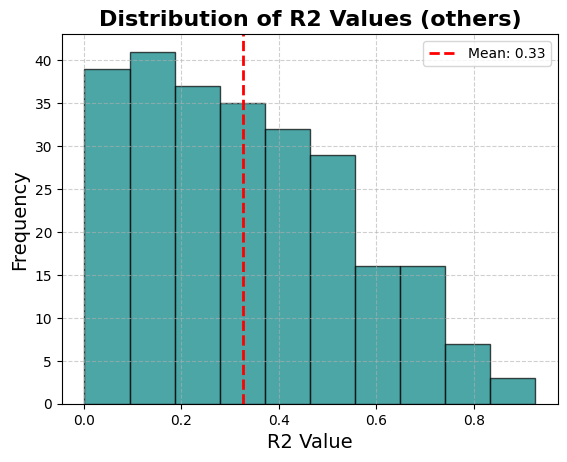

KS Statistic: 0.0
P-value: 1.0
No significant difference between the distributions (p >= 0.05).


In [119]:
Group_name = ['super healthy','Very Preterm','Late Preterm', 'Preeclampsia', 'Postpartum Hemorrhage (PPH)', 'others']
#super_healthy_id
v_pre_id = static_feat2.loc[(static_feat2.gestage_week>=28) & (static_feat2.gestage_week<32)].record_id.unique() #very preterm
l_pre_id = static_feat2.loc[(static_feat2.gestage_week>=32) & (static_feat2.gestage_week<=37)].record_id.unique() #late preterm
hyper_id = df_birth.loc[df_birth.hypertension == 1].record_id.unique()
hem_id = df_birth.loc[df_birth.postparhem == 1].record_id.unique()

record_ids = weekly_avg_df.record_id.unique()
vertexs = []
r2_list_other = []
r2_list_healthy = []
r2_list_v_pre, r2_list_l_pre, r2_list_hyper, r2_list_hem = [],[],[],[]

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.awake.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]
    flag_others = True
    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)

        vertexs.append(vertex_x)
        if user in super_healthy_id:
            r2_list_healthy.append(r2_value)
        if user in v_pre_id:
            r2_list_v_pre.append(r2_value); flag_others=False
        if user in l_pre_id:
            r2_list_l_pre.append(r2_value); flag_others=False
        if user in hyper_id:
            r2_list_hyper.append(r2_value); flag_others=False
        if user in hem_id:
            r2_list_hem.append(r2_value); flag_others=False
        if flag_others:
            r2_list_other.append(r2_value)
            
list_all = []
list_all.append(r2_list_healthy); list_all.append(r2_list_v_pre); list_all.append(r2_list_l_pre)
list_all.append(r2_list_hyper); list_all.append(r2_list_hem); list_all.append(r2_list_other)
for i in range(len(Group_name)):
    print(f'{Group_name[i]} length: {len(list_all[i])}')
    
    if len(list_all[i])==0:
        continue

    fig, ax = plt.subplots()

    ax.hist(list_all[i], bins=10, color='teal', edgecolor='black', alpha=0.7)
    mean_value = np.mean(list_all[i])
    ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
    ax.set_title(f'Distribution of R2 Values ({Group_name[i]})', fontsize=16, fontweight='bold')
    ax.set_xlabel('R2 Value', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend()
    plt.show()

    # Perform the Kolmogorov-Smirnov test
    ks_statistic, p_value = ks_2samp(r2_list_other, list_all[i])

    print(f"KS Statistic: {ks_statistic}")
    print(f"P-value: {p_value}")

    if p_value < 0.05:
        print("The distributions are statistically different (p < 0.05).")
    else:
        print("No significant difference between the distributions (p >= 0.05).")

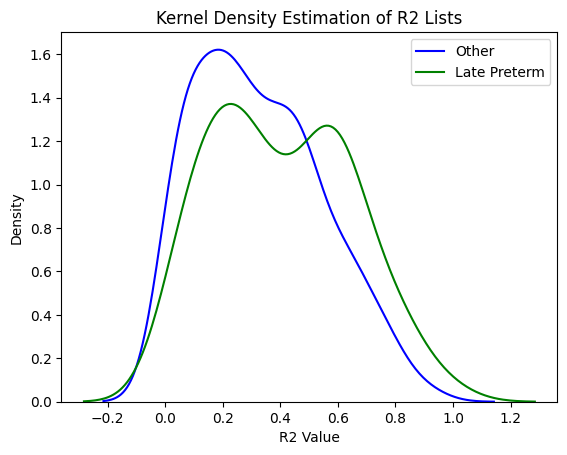

In [120]:
sns.kdeplot(r2_list_other, label='Other', color='blue')
sns.kdeplot(r2_list_l_pre, label='Late Preterm', color='green')
plt.title('Kernel Density Estimation of R2 Lists')
plt.xlabel('R2 Value')
plt.ylabel('Density')

# Show legend
plt.legend()

# Show the plot
plt.show()

In [60]:
dict_all_name = {
    "preterm": preterm,
    "gestationalDM": gestationalDM,
    "preeclampsia": preeclampsia,
    "gestationalHTN": gestationalHTN,
    "postpartumHemorrhage": postpartumHemorrhage,
    "depression": depression,
    "superHealthy": superHealthy
}

In [61]:
all_users = preterm | gestationalDM | preeclampsia | gestationalHTN | postpartumHemorrhage | depression | superHealthy

# Initialize the DataFrame with all user IDs
pregnancy_conditions = pd.DataFrame({'record_id': list(all_users)})

# Define a function to create a column based on membership in a set
def membership_column(user_set, all_users):
    return [1 if user in user_set else 0 for user in all_users]

# Add columns for each set
pregnancy_conditions['preterm'] = membership_column(preterm, pregnancy_conditions['record_id'])
pregnancy_conditions['gestationalDM'] = membership_column(gestationalDM, pregnancy_conditions['record_id'])
pregnancy_conditions['preeclampsia'] = membership_column(preeclampsia, pregnancy_conditions['record_id'])
pregnancy_conditions['gestationalHTN'] = membership_column(gestationalHTN, pregnancy_conditions['record_id'])
pregnancy_conditions['postpartumHemorrhage'] = membership_column(postpartumHemorrhage, pregnancy_conditions['record_id'])
pregnancy_conditions['depression'] = membership_column(depression, pregnancy_conditions['record_id'])
pregnancy_conditions['superHealthy'] = membership_column(superHealthy, pregnancy_conditions['record_id'])


In [63]:
pregnancy_conditions_analysis = pd.merge(df_w_static, pregnancy_conditions, on='record_id', how='inner')
# 'how' can be 'inner', 'left', 'right', or 'outer'

In [64]:
pregnancy_conditions_analysis = pd.merge(pregnancy_conditions_analysis, sorted_r2_df, on='record_id', how='inner')


In [65]:
len(sorted_r2_df.record_id.unique()), len(pregnancy_conditions_analysis.record_id.unique())

(306, 204)

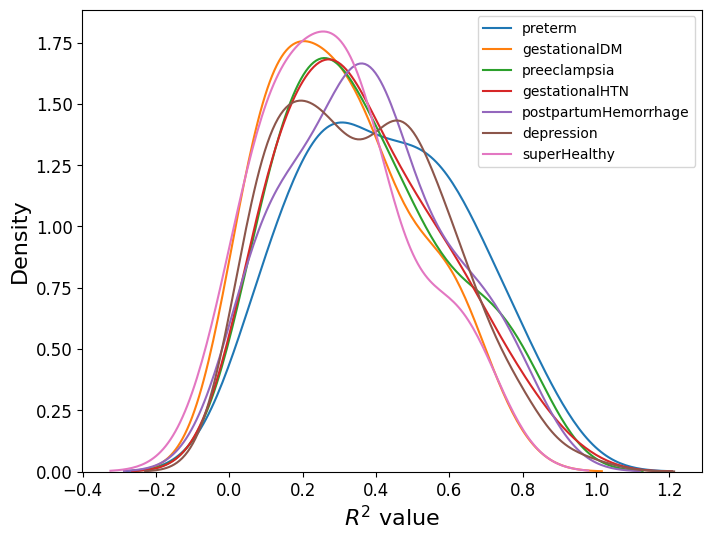

In [67]:
Group_name = ['superHealthy','Very Preterm','Late Preterm', 'Preeclampsia', 'Postpartum Hemorrhage (PPH)', 'others']
all_conditions = {
    "preterm": [],
    "gestationalDM": [],
    "preeclampsia": [],
    "gestationalHTN": [],
    "postpartumHemorrhage": [],
    "depression": [],
    "superHealthy": []
}
opposite_all_conditions = {
    "preterm": [],
    "gestationalDM": [],
    "preeclampsia": [],
    "gestationalHTN": [],
    "postpartumHemorrhage": [],
    "depression": [],
    "superHealthy": []
}

all_r2 = []
r2_list_other = []
#super_healthy_id
v_pre_id = static_feat2.loc[(static_feat2.gestage_week>=28) & (static_feat2.gestage_week<32)].record_id.unique() #very preterm
l_pre_id = static_feat2.loc[(static_feat2.gestage_week>=32) & (static_feat2.gestage_week<=37)].record_id.unique() #late preterm
hyper_id = df_birth.loc[df_birth.hypertension == 1].record_id.unique()
hem_id = df_birth.loc[df_birth.postparhem == 1].record_id.unique()

record_ids = weekly_avg_df.record_id.unique()
vertexs = []

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.awake.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]
    flag_others = True
    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)
        
        vertexs.append(vertex_x)
        all_r2.append(r2_value)
        for condition in all_conditions.keys():
            if user in dict_all_name[condition]:
                all_conditions[condition].append(r2_value)
                if condition != "superHealthy":
                    flag_others=False
            else:
                opposite_all_conditions[condition].append(r2_value)
        if flag_others:
            r2_list_other.append(r2_value)
            
plt.figure(figsize=(8, 6), dpi=100)
p_value_all = []
# Loop over each condition and plot the KDE for the r2_value where the condition is 1
for condition in all_conditions:
    positive_condition = all_conditions[condition]
    negative_condition = opposite_all_conditions[condition] 
    #negative_condition = r2_list_other 

    sns.kdeplot(positive_condition, fill=False, label=condition)
    # Perform independent two-sample t-test
    #t_stat, p_value = stats.ttest_ind(positive_condition["r2_value"], negative_condition["r2_value"])
    ks_statistic, p_value = ks_2samp(positive_condition, negative_condition)

    p_value_all.append(p_value)
# plt.title('Kernel Density Plot for r2_value across Conditions')
plt.xlabel('$R^2$ value', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend()
plt.show()

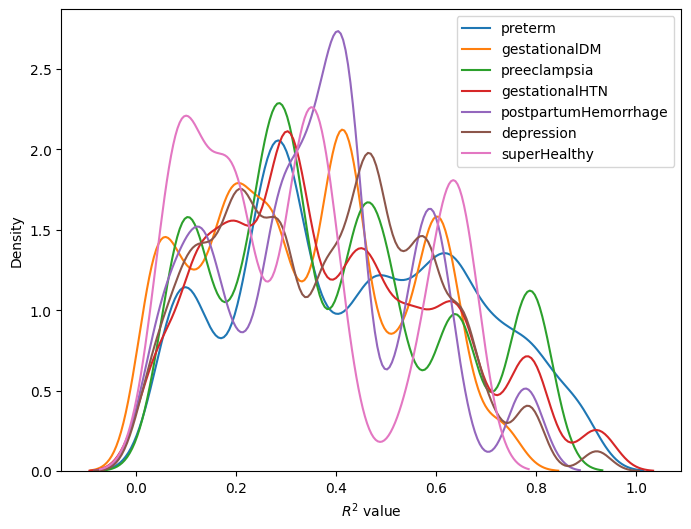

In [55]:
plt.figure(figsize=(8, 6), dpi=100)
all_conditions = ["preterm", "gestationalDM", "preeclampsia", "gestationalHTN", "postpartumHemorrhage", "depression", "superHealthy"]
p_value_all = []
# Loop over each condition and plot the KDE for the r2_value where the condition is 1
for condition in all_conditions:
    positive_condition = pregnancy_conditions_analysis[pregnancy_conditions_analysis[condition] == 1]
    negative_condition = pregnancy_conditions_analysis[pregnancy_conditions_analysis[condition] == 0]
    sns.kdeplot(positive_condition['r2_value'], fill=False, label=condition)
    # Perform independent two-sample t-test
    t_stat, p_value = stats.ttest_ind(positive_condition["r2_value"], negative_condition["r2_value"])
    p_value_all.append(p_value)
# plt.title('Kernel Density Plot for r2_value across Conditions')
plt.xlabel('$R^2$ value')
plt.ylabel('Density')
plt.legend()
plt.show()

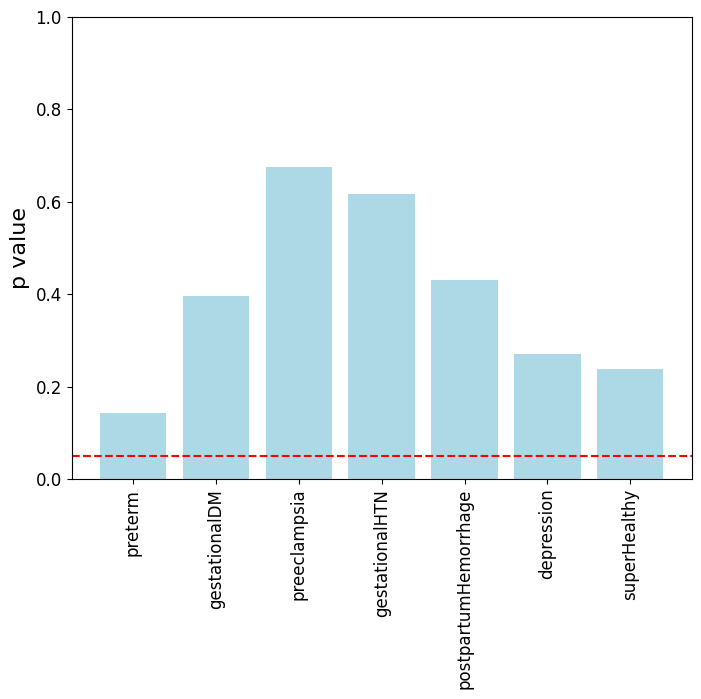

In [68]:
# Plotting the vertical bar graph
plt.figure(figsize=(8, 6), dpi=100)
plt.bar(all_conditions.keys(), p_value_all, color='lightblue')

plt.ylim([0, 1])
# Adding title and labels
plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)
# plt.xlabel('conditions')
plt.axhline(0.05, color='red', linestyle='--')
plt.ylabel('p value', fontsize=16)
plt.show()

In [75]:
df_w_static.columns #prev_baby_c, bmi_c, age_c

Index(['record_id', 'daysSince', 'deep', 'rem', 'light', 'total',
       'temperature_delta', 'temperature_deviation',
       'temperature_trend_deviation', 'awake', 'gestage_week', 'age',
       'weight_pre', 'bmi', 'n_prev_baby', 'birth_mode', 'induction_yn',
       'EED_b1', 'EED_b2', 'EED_a1', 'EED_a2', 'EED_g', 'time', 'GW_class',
       'bmi_c', 'bmi_c2', 'age_c', 'map_id', 'Gestational_week'],
      dtype='object')

In [85]:
df_w_static['prev_baby_c'] = df_w_static.n_prev_baby>0

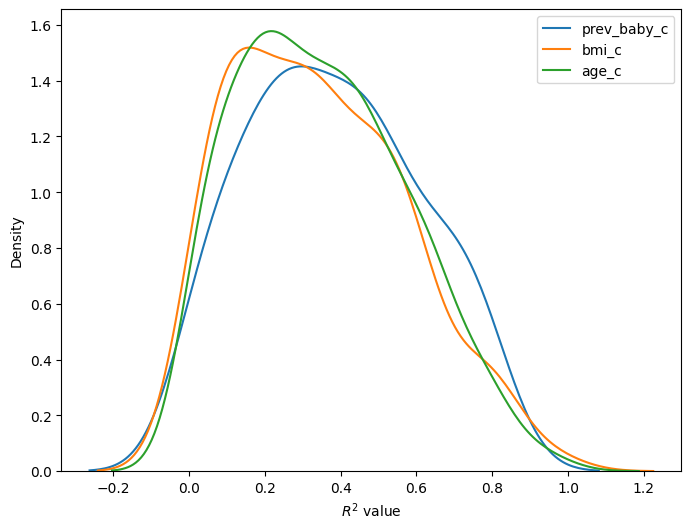

In [101]:
Group_name = ['Previous Baby','BMI 25','Age 30']
all_conditions = {
    "prev_baby_c": [],
    "bmi_c": [],
    "age_c": []
}

opposite_all_conditions = {
    "prev_baby_c": [],
    "bmi_c": [],
    "age_c": []
}

all_r2 = []
r2_list_other = []
#super_healthy_id

record_ids = weekly_avg_df.record_id.unique()
vertexs = []

for user in record_ids:
    if user not in df_w_static.record_id.values:
        continue
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.awake.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]
    flag_others = True
    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)
        
        vertexs.append(vertex_x)
        all_r2.append(r2_value)
        for condition in all_conditions.keys():
            #print(condition, df_w_static.loc[df_w_static.record_id==user,condition].iloc[0])
            if df_w_static.loc[df_w_static.record_id==user,condition].iloc[0]:
                all_conditions[condition].append(r2_value)
            else:
                opposite_all_conditions[condition].append(r2_value)
            
plt.figure(figsize=(8, 6), dpi=100)
p_value_all = []
# Loop over each condition and plot the KDE for the r2_value where the condition is 1
for condition in all_conditions:
    positive_condition = all_conditions[condition]
    negative_condition = opposite_all_conditions[condition] 
    #negative_condition = r2_list_other 

    sns.kdeplot(positive_condition, fill=False, label=condition)
    # Perform independent two-sample t-test
    #t_stat, p_value = stats.ttest_ind(positive_condition["r2_value"], negative_condition["r2_value"])
    ks_statistic, p_value = ks_2samp(positive_condition, negative_condition)

    p_value_all.append(p_value)
# plt.title('Kernel Density Plot for r2_value across Conditions')
plt.xlabel('$R^2$ value')
plt.ylabel('Density')
plt.legend()
plt.show()

Text(0, 0.5, 'p value')

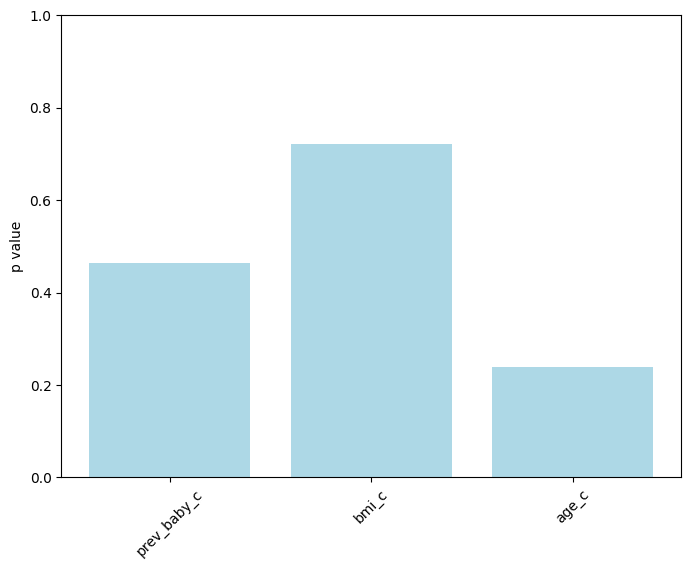

In [102]:
# Plotting the vertical bar graph
plt.figure(figsize=(8, 6), dpi=100)
plt.bar(all_conditions.keys(), p_value_all, color='lightblue')

plt.ylim([0, 1])
# Adding title and labels
plt.xticks(rotation=45)
# plt.xlabel('conditions')
plt.ylabel('p value')

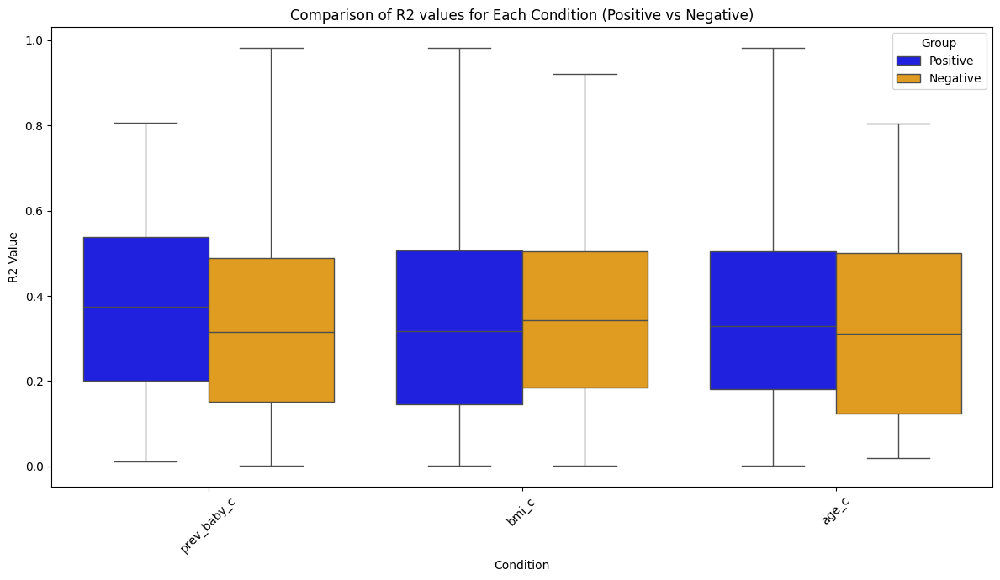

In [106]:
# Prepare the data for boxplot
data = []
conditions = []
group_labels = []

for condition in all_conditions:
    # Data for the positive condition
    positive_condition = all_conditions[condition]
    data.extend(positive_condition)  # Add the data points
    conditions.extend([condition] * len(positive_condition))  # Label the data points by condition
    group_labels.extend(['Positive'] * len(positive_condition))  # Label the group as 'Positive'
    
    # Data for the negative condition
    negative_condition = opposite_all_conditions[condition]
    data.extend(negative_condition)  # Add the data points
    conditions.extend([condition] * len(negative_condition))  # Label the data points by condition
    group_labels.extend(['Negative'] * len(negative_condition))  # Label the group as 'Negative'

# Create a DataFrame to store the data, condition labels, and group labels
df_conditions = pd.DataFrame({
    'R2_value': data,
    'Condition': conditions,
    'Group': group_labels  # This distinguishes between 'Positive' and 'Negative'
})

# Define a color palette for the groups
palette = {"Positive": "blue", "Negative": "orange"}  # Customize colors for each group

# Plot the boxplot with comparisons between Positive and Negative groups for each condition
plt.figure(figsize=(12, 7))
sns.boxplot(x='Condition', y='R2_value', hue='Group', data=df_conditions, palette=palette)
plt.title('Comparison of R2 values for Each Condition (Positive vs Negative)')
plt.xlabel('Condition')
plt.ylabel('R2 Value')
plt.xticks(rotation=45)
plt.legend(title='Group')
plt.tight_layout()
plt.show()
